In [2]:
from PIL import Image
import numpy as np 
import os 


import numpy as np
import matplotlib.pyplot as pl
import torch
import ot
import ot.plot

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Enable interactive mode
%matplotlib ipympl
os.environ["CUDA_VISIBLE_DEVICES"] = "1" # has not effect

import sys
sys.path.append("../")
device="cuda"
from tqdm import tqdm_notebook as tqdm

from gaussian_renderer import render, network_gui
from arguments import ModelParams, PipelineParams, OptimizationParams
import argparse
from scene import Scene, GaussianModel
from random import randint
from argparse import ArgumentParser, Namespace

saving_steps = [1, 100, 300, 1_000, 3_000, 7_000, 10_000, 15_000, 20_000, 30_000]
parser = ArgumentParser(description="Training script parameters")
lp = ModelParams(parser)
op = OptimizationParams(parser)
pp = PipelineParams(parser)
parser.add_argument('--ip', type=str, default="127.0.0.1")
parser.add_argument('--port', type=int, default=6009)
parser.add_argument('--debug_from', type=int, default=-1)
parser.add_argument('--detect_anomaly', action='store_true', default=False)
parser.add_argument("--test_iterations", nargs="+", type=int, default=saving_steps)
parser.add_argument("--save_iterations", nargs="+", type=int, default=saving_steps)
parser.add_argument("--quiet", action="store_true")
parser.add_argument("--checkpoint_iterations", nargs="+", type=int, default=saving_steps)# default=[])
parser.add_argument("--start_checkpoint", type=str, default = None)
args = parser.parse_args(("-s /home/dimakot55/data/nerf_synthetic/hotdog/ "+\
                         "--model_path /home/dimakot55/workspace/gaussian-splatting/notebooks/GT_lego_cluster2_test_notebook14/").split())#sys.argv[1:])
#args.save_iterations.append(args.iterations)
dataset=lp.extract(args)
pipe=pp.extract(args)
opt=op.extract(args)
os.makedirs(args.model_path, exist_ok=True)

In [3]:

# Functions from @Mateen Ulhaq and @karlo for visualizing 3d points with equal scaling of axes
def set_axes_equal(ax: plt.Axes):
    """Set 3D plot axes to equal scale.

    Make axes of 3D plot have equal scale so that spheres appear as
    spheres and cubes as cubes.  Required since `ax.axis('equal')`
    and `ax.set_aspect('equal')` don't work on 3D.
    """
    limits = np.array([
        ax.get_xlim3d(),
        ax.get_ylim3d(),
        ax.get_zlim3d(),
    ])
    origin = np.mean(limits, axis=1)
    radius = 0.5 * np.max(np.abs(limits[:, 1] - limits[:, 0]))
    _set_axes_radius(ax, origin, radius)

def _set_axes_radius(ax, origin, radius):
    x, y, z = origin
    ax.set_xlim3d([x - radius, x + radius])
    ax.set_ylim3d([y - radius, y + radius])
    ax.set_zlim3d([z - radius, z + radius])



# Initialize content scene

In [4]:
os.makedirs(args.model_path, exist_ok=True)
content_gaussians = GaussianModel(3)
content_scene = Scene(dataset, content_gaussians, shuffle=True)
content_gaussians.training_setup(opt)

Found transforms_train.json file, assuming Blender data set!
Reading Training Transforms
Reading Test Transforms
Loading Training Cameras
Loading Test Cameras
Number of points at initialisation :  100000


In [7]:

# content_gaussians.restore(torch.load("/home/dimakot55/output_data/gs_fitted/gs_fitted/GT_hotdog_spheres/chkpnt30000.pth")[0], opt)
# content_gaussians.restore(torch.load("/home/dimakot55/output_data/gs_fitted/gs_fitted/GT_hotdog/chkpnt30000.pth")[0], opt)

# content_gaussians.restore(torch.load("/home/dimakot55/output_data/gs_my/gs/GT_hotdog/chkpnt30000.pth")[0], opt)
content_gaussians.restore(torch.load("/home/dimakot55/output_data/gs/GT_hotdog/chkpnt30000.pth")[0], opt)
# content_gaussians.restore(torch.load("/home/dimakot55/output_data/gs_fitted/gs_fitted/GT_chair_spheres/chkpnt30000.pth")[0], opt)

In [8]:
content_gaussians_features_dc_orig = content_gaussians._features_dc.data.detach().clone()
content_gaussians_features_rest_orig = content_gaussians._features_rest.data.detach().clone()


In [9]:
# Turn color into coordinates. We will need that to optimize 
# Remove view dependent effects and make all the gaussians opaque. 
# That helps with getting a better mesh
content_gaussians._opacity.data +=  1e6
content_gaussians_features_ds_original = content_gaussians._features_dc.detach().clone()
content_gaussians._features_dc.data = content_gaussians._xyz.data.clone().detach().unsqueeze(1)
content_gaussians._features_rest.data = content_gaussians._features_rest.data * 0.
# content_gaussians._scaling.data *=  .98


In [10]:

bg_color = [1, 1, 1] if dataset.white_background else [0, 0, 0]
background = torch.tensor(bg_color, dtype=torch.float32, device=device)
viewpoint_stack = content_scene.getTrainCameras().copy()
viewpoint_cam = viewpoint_stack.pop(randint(0, len(viewpoint_stack)-1))



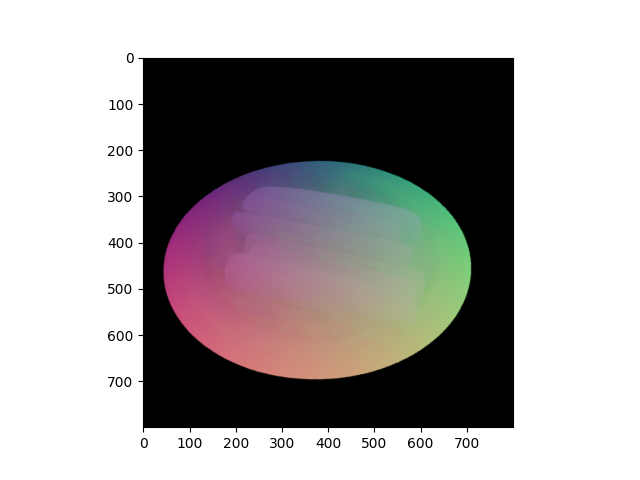

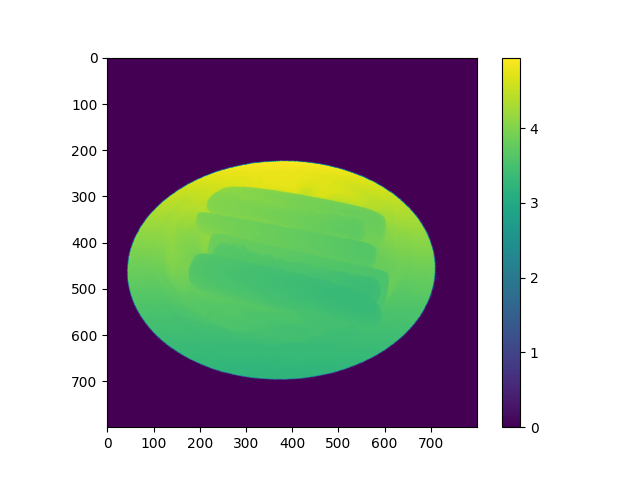

In [78]:

render_pkg_cont = render(viewpoint_cam, content_gaussians, pipe, background)
image_cont, depth_cont= render_pkg_cont["render"], render_pkg_cont["depth"]

image_rgb = image_cont.detach().cpu().numpy().transpose(1, 2, 0)
plt.figure()
plt.imshow(image_rgb)
plt.show()


depth_np = depth_cont.detach().cpu().numpy()

plt.figure()
plt.imshow(depth_np)
plt.colorbar()
plt.show()


# Init surface and find better initialization points.

In [12]:

def obtain_surface_pc(viewpoint_stack, gaussians, pipe, background, num_viewpoints=40, pc_size=20000):
    import numpy as np
    import skimage.measure, skimage.morphology
    import scipy

    # 1. Render from different viewpoints and extract points
    all_points = []
    for iter in range(min(num_viewpoints, len(viewpoint_stack))):
        viewpoint_cam = viewpoint_stack.pop(randint(0, len(viewpoint_stack)-1))
        render_pkg_cont = render(viewpoint_cam, gaussians, pipe, background)
        image = render_pkg_cont["render"]
        image_rgb = image.detach().cpu().numpy().transpose(1, 2, 0)
        image_maxpool = skimage.measure.block_reduce(image_rgb, (3,3,1), np.max)
        mask = scipy.ndimage.binary_erosion(np.max(image_maxpool, axis=-1) > 0.1, structure=None, iterations=5)
        image_clean = image_maxpool * np.expand_dims(mask, axis=-1)
        all_points += list(image_clean[np.min(image_clean, axis=-1)>0.1])
    
    
    # 2. Subsample the points 
    all_points = np.array(all_points)
    all_points_idcs = np.random.choice(range(len(all_points)), size=pc_size, replace=False) 
    all_points = all_points[all_points_idcs]

    # 3. Remove poitns that are too far away from all other points.
    # Compute all pairwise distances between points
    from scipy.spatial import distance
    k=10
    pairwise_distances = distance.cdist(all_points, all_points, 'euclidean')
    # Use np.partition to find the k-th smallest distances for each row
    kth_nearest_indices = np.argpartition(pairwise_distances, k, axis=1)[:, :k]
    kth_nearest_distances = np.take_along_axis(pairwise_distances, kth_nearest_indices, axis=1)
    q_outliers = np.quantile(np.max(kth_nearest_distances, axis=-1), 0.99)
    idcs = np.where(np.max(kth_nearest_distances, axis=-1) < q_outliers)[0]
    all_points = all_points[idcs]
    return all_points
        

In [13]:

content_surface_pc = obtain_surface_pc(viewpoint_stack=viewpoint_stack, 
                               gaussians=content_gaussians, 
                               pipe=pipe, 
                               background=background,
                               num_viewpoints=40)
# Rescale back. This can be a very wrong way to do that. Check better the rasterization code for 
content_surface_pc_orig = np.array(content_surface_pc)
coords = content_gaussians._xyz.data.detach().cpu().numpy()
content_surface_pc = (content_surface_pc - np.min(content_surface_pc)) / (np.max(content_surface_pc)  - np.min(content_surface_pc))
content_surface_pc = content_surface_pc * (np.max(coords)  - np.min(coords)) + np.min(coords)

In [14]:
all_points = content_gaussians._xyz.data.detach().cpu().numpy()

all_points = np.array(all_points)
all_points_idcs = np.random.choice(range(len(all_points)), size=50000, replace=False) 
content_surface_pc = all_points[all_points_idcs]

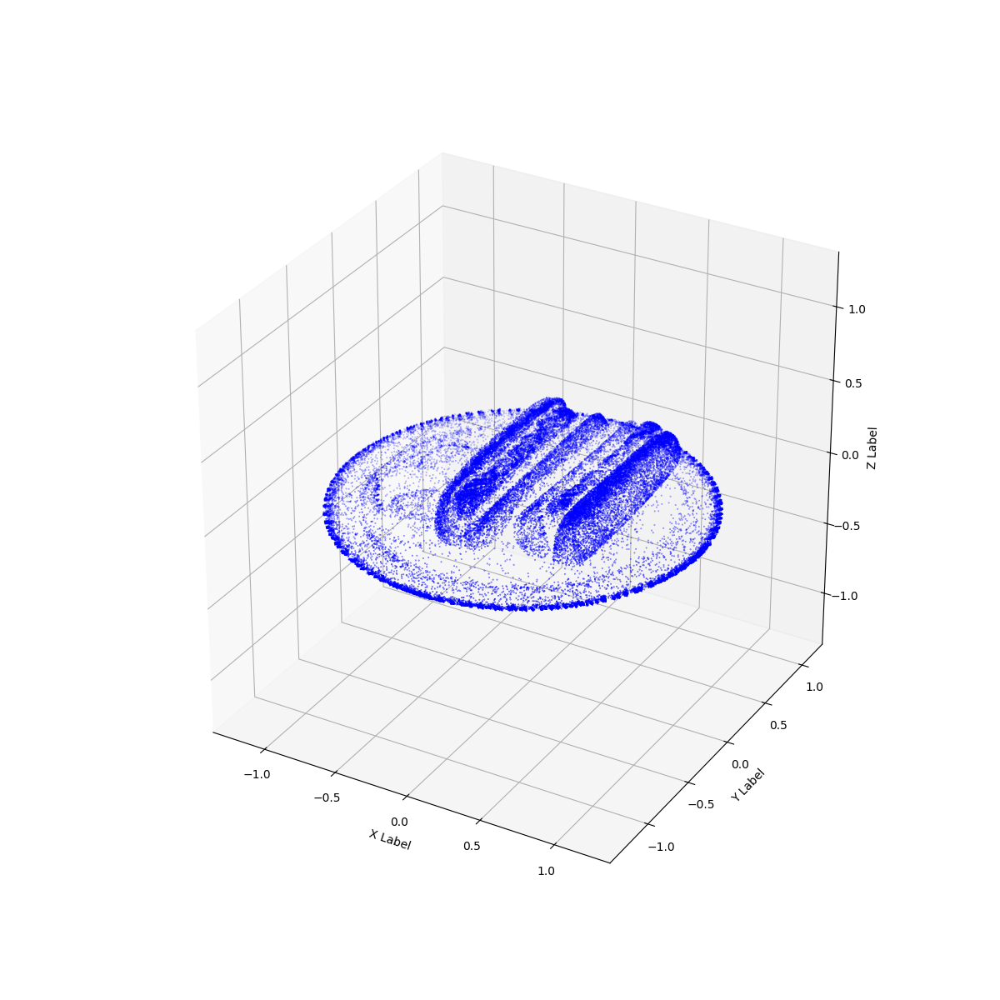

In [15]:
# Create a 3D scatter plot
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111, projection='3d')
#ax.axis('equal')
ax.set_aspect('equal')
# Plot target shape

# Plot the scatter points
kth=1
if True:
    ax.scatter(content_surface_pc[::kth,0], 
               content_surface_pc[::kth,1], 
               content_surface_pc[::kth,2], c='b', marker='o',s=0.1)



# Set labels for the axes
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

ax.set_box_aspect([1,1,1]) # IMPORTANT - this is the new, key line
# ax.set_proj_type('ortho') # OPTIONAL - default is perspective (shown in image above)
set_axes_equal(ax) # IMPORTANT - this is also required
plt.show()

In [ ]:

import torch
import torch.nn.functional as F
from scipy.spatial import distance
import numpy as np
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA


def sample_points_by_density(points, num_samples=None, radius = 0.05, device='cuda'):
    """
    Samples points inversely proportional to their density in the neighborhood.
    :param points: torch tensor of shape [N,3]
    :param num_samples: Number of samples to be drawn according to the
        distribution of densities. If None, then we sample 1/10th of the points.
    :param radius: Radius of the local region around each point at which we compute
        the number of neighbors.
    :param device: Device on which the tensors are stored and computations will be done.
    :return: A torch tensor of shape [num_samples] containing the indices of the sampled points
    """


    # Assuming you have a PyTorch tensor of shape [N, 3] representing points
    # Calculate pairwise distances between all points
    # Note that i only compute distance to every 10th neighbor.
    distances = torch.cdist(points, points[::10])


    # Calculate the number of points within the local region for each point
    num_points_in_local_region = (distances <= radius).sum(dim=1)

    # Calculate the inverse density as a weight
    inverse_density = 1.0 / (num_points_in_local_region + 1)  # Add 1 to avoid division by zero

    # Normalize the weights to create a probability distribution
    probability_distribution = inverse_density / inverse_density.sum()

    # Sample points inversely proportional to their density
    if num_samples is None:
        num_samples = len(points) // 10  # Adjust the number of samples as needed
    sampled_indices = torch.multinomial(probability_distribution, num_samples, replacement=True)

    return sampled_indices
    
def remove_outliers(points, kth_neighbor=30, q=0.925, device='cuda'):
    """
    Removes outliers from the given points. Usually the set of clusters must be small to avoid
    quadratic complexity of the all pairwise neighbors computation.
    :param points: torch tensor of shape [N, 3]
    :param kth_neighbor: this neighbor we use to approximate good neighborhood density.
    :param q: Quantile to use for removing outliers.
    :param device: Device on which the tensors are stored and computations will be done.
    :return: A torch tensor of shape [N] containing the indices of the non-outlier points.
    """

    pairwise_distances = torch.cdist(points, points)
    kth_nearest_dists, kth_nearest_indices = torch.topk(pairwise_distances, k=kth_neighbor, dim=1, largest=False, sorted=True)
    q_outliers = torch.quantile(kth_nearest_dists[:, kth_neighbor-1], q=q)
    indcs_relevant = torch.where(kth_nearest_dists[:, kth_neighbor-1] < q_outliers)[0]
    return indcs_relevant

def prepare_scene(points, num_clusters=40, num_samples=None, radius=0.05, q=0.925, device='cuda'):
    """
    Prepares the scene by sampling points and clustering them.
    :param points: torch tensor of shape [N, 3]
    :param num_clusters: Number of clusters to use for KMeans clustering.
    :param num_samples: Number of samples to be drawn according to the
        distribution of densities. If None, then we sample 1/10th of the points from EACH cluster
    :param radius: Radius of the local region around each point at which we compute
        the number of neighbors.
    :param device: Device on which the tensors are stored and computations will be done.
    :return: A tuple containing the following tensors:
    """

     # Use KMeans clustering to find the centroids of the clusters
    kmeans = KMeans(init="k-means++", n_clusters=num_clusters, n_init=4)
    kmeans.fit(points.detach().cpu().numpy())
    clean_indices = []
    for lbls in np.unique(kmeans.labels_):
        cluster_points_idcs = np.where(kmeans.labels_ == lbls)[0]
        # Remove outliers
        non_outliers_idcs = remove_outliers(points[cluster_points_idcs], q=q, device=device)
        cluster_points_idcs = cluster_points_idcs[non_outliers_idcs.cpu().numpy()]
        # Sample points inversely proportional to the density
        sampled_idcs = sample_points_by_density(points[cluster_points_idcs], num_samples, radius, device)
        cluster_points_idcs = cluster_points_idcs[sampled_idcs.cpu().numpy()]
        clean_indices.append(cluster_points_idcs)

    return clean_indices, kmeans.cluster_centers_, kmeans.labels_[np.concatenate(clean_indices)]


In [161]:
content_shape_idcs, content_shape_cluster_centers, content_shape_cluster_labels = prepare_scene(
        points=torch.tensor(content_surface_pc).to(device=device),
    num_samples=None,
    radius=0.035,
    q=0.975, #0.975,
    num_clusters=160,
    device=device)


# Load cluster

In [87]:

loaded_data = np.load("/home/dimakot55/output_data/gs/GT_lego_spheres_v5_clusters_100/cluster_51.npz") # 51, 36, 49, 24, 40, 57, 45, 22, 20, 3, 32, 25,  19, 16, 17, 15, 13, 14
# loaded_data = np.load("/home/dimakot55/output_data/gs_my/GT_rose_bush_spheres_clusters_10/cluster_9.npz")
loaded_data = np.load("/home/dimakot55/output_data/gs_my/GT_rose_bush_spheres_clusters_30/cluster_12.npz")
#loaded_data = np.load("/home/dimakot55/output_data/clusters/GT_coast_rocks_spheres_clusters=50/cluster_15.npz")
# loaded_data = np.load("/home/dimakot55/output_data/clusters/GT_grass_spheres_clusters=4/cluster_1.npz")

# loaded_data = np.load("/home/dimakot55/output_data/gs_my/GT_brickwall_spheres_clusters_50/cluster_14.npz") # 51, 36, 49, 24, 40, 57, 45, 22, 20, 3, 32, 25,  19, 16, 17, 15, 13, 14

# Access the arrays by their names
gaussians_xyz = loaded_data['_xyz']
gaussians_features_dc = loaded_data['_features_dc']
gaussians_features_rest = loaded_data['_features_rest']
gaussians_rotation = loaded_data['_rotation']
gaussians_scaling = loaded_data['_scaling']
gaussians_opacity = loaded_data['_opacity']

# 0. only for the bricks scene. Remove poitns underneath. and change size to smaller scale. Multiply coordinates and sizes.
idcs = np.where(gaussians_xyz[:,2]>-0.12)[0]
gaussians_xyz = gaussians_xyz[idcs]
gaussians_features_dc = gaussians_features_dc[idcs]
gaussians_features_rest = gaussians_features_rest[idcs]
gaussians_rotation = gaussians_rotation[idcs]
gaussians_scaling = gaussians_scaling[idcs]
gaussians_opacity = gaussians_opacity[idcs]




# 1. Remove poitns that are too far away from all other points. These are just noise
# Compute all pairwise distances between points
from scipy.spatial import distance
k=30
pairwise_distances = distance.cdist(gaussians_xyz, gaussians_xyz, 'euclidean')
# Use np.partition to find the k-th smallest distances for each row
kth_nearest_indices = np.argpartition(pairwise_distances, k, axis=1)[:, :k]
kth_nearest_distances = np.take_along_axis(pairwise_distances, kth_nearest_indices, axis=1)
q_outliers = np.quantile(np.max(kth_nearest_distances, axis=-1), 0.99925) # was 0.925
idcs = np.where(np.max(kth_nearest_distances, axis=-1) < q_outliers)[0]
gaussians_xyz = gaussians_xyz[idcs]
gaussians_features_dc = gaussians_features_dc[idcs]
gaussians_features_rest = gaussians_features_rest[idcs]
gaussians_rotation = gaussians_rotation[idcs]
gaussians_scaling = gaussians_scaling[idcs]
gaussians_opacity = gaussians_opacity[idcs]

# preprocess colors
colors = np.array(gaussians_features_dc[:,0])
#colors = (colors - np.min(colors)) / (np.max(colors) - np.min(colors))
def sigmoid(x):
    return 1 / (1 + np.exp(-x))
colors=sigmoid(colors)

# preprocess sizes. Transform scaling to a format somewhat acceptable 
# by the ax.scatter function
sizes = np.array(gaussians_scaling[:,0])
q05 = np.quantile(sizes, 0.5)
#sizes = sizes * (sizes > q05)
sizes = -sizes * 4. 

# Transform opacity to the format acceptable by ax.scatter
alpha = np.array(gaussians_opacity[:,0])
#alpha = alpha / np.max(alpha)
alpha = np.clip(alpha, 0., 1.)


# Extra increase the volume of the points to make results more apparent
with torch.no_grad():
    gaussians_xyz[:,2] = gaussians_xyz[:,2]*1.0 # for lego
    # gaussians_xyz[:,2] = gaussians_xyz[:,2]*1.0 # for bricks 

In [103]:
# loaded_data = np.load("/home/dimakot55/output_data/clusters/GT_grass_spheres_clusters=1/cluster_0.npz")
loaded_data = np.load("/home/dimakot55/output_data/clusters/GT_coast_rocks_spheres_clusters=50/cluster_15.npz")

# loaded_data = np.load("/home/dimakot55/output_data/gs_my/GT_brickwall_spheres_clusters_50/cluster_14.npz") # 51, 36, 49, 24, 40, 57, 45, 22, 20, 3, 32, 25,  19, 16, 17, 15, 13, 14

# Access the arrays by their names
gaussians_xyz = loaded_data['_xyz']
gaussians_features_dc = loaded_data['_features_dc']
gaussians_features_rest = loaded_data['_features_rest']
gaussians_rotation = loaded_data['_rotation']
gaussians_scaling = loaded_data['_scaling']
gaussians_opacity = loaded_data['_opacity']


FileNotFoundError: [Errno 2] No such file or directory: '/home/dimakot55/output_data/clusters/GT_coast_rocks_spheres_clusters=50/cluster_15.npz'

In [32]:
gaussians_xyz = gaussians_xyz*2.
gaussians_scaling = gaussians_scaling*2.

In [41]:
gaussians_scaling = gaussians_scaling*2.

In [ ]:
gaussians_xyz = gaussians_xyz*1. # for grass 

[   0    1    2 ... 9988 9989 9990]


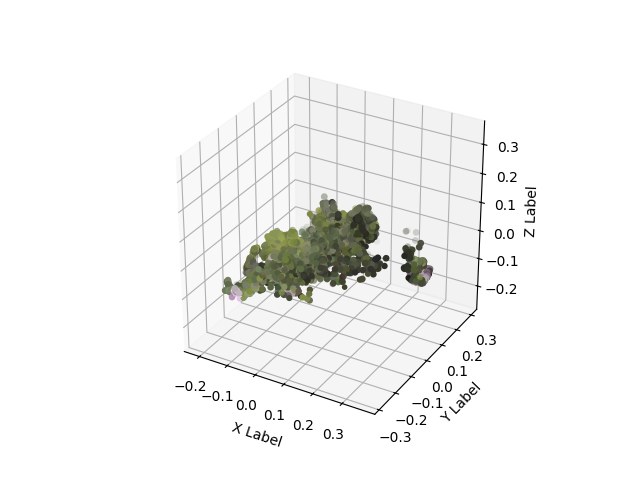

In [88]:


# Create a 3D scatter plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
#ax.axis('equal')
#ax.set_aspect('equal')
# Plot the scatter points
idcs = np.where(gaussians_xyz[:,2]>-0.25)[0]
print(idcs)
ax.scatter(gaussians_xyz[idcs,0], 
           gaussians_xyz[idcs,1], 
           gaussians_xyz[idcs,2],#*1.5, 
           c=np.concatenate([colors, alpha[:,None]], axis=-1)[idcs],# c='b', 
           marker='o',
           s=sizes[idcs], #s=25.,
           #alpha=alpha,
           depthshade=False,
           edgecolors='none')
           #fillstyle='full',
           #markeredgecolor='red',
           #markeredgewidth=0.0)

# Set labels for the axes
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')
ax.set_box_aspect([1,1,1]) # IMPORTANT - this is the new, key line
# ax.set_proj_type('ortho') # OPTIONAL - default is perspective (shown in image above)
set_axes_equal(ax) # IMPORTANT - this is also required
plt.show()





In [89]:
import kornia
def shade_image_gpu(img_color, img_depth,
                drct_lght_color = np.array([1., 1., 1.]), drct_lght_dir = np.array([0., 0., 1.]),
                ambnt_lght=np.array([0.1, 0.1, 0.1]) ):
    """
    Relights the image given by the color of every pixel and its normals. Additionally use the sf
    Implementation is taken from this video https://youtu.be/wOyavGx28uU?t=1084 .
    :param img_color: numpy array of shape [H,W,D] with values in [0,1]
    :param img_normals: numpy array of shape [H,W,D] with values in [0,1] and norm along last dim is 1
    :param 
    
    """

     
    K = torch.tensor([[1111, 0, 400],
                      [0,    1111, 400],
                      [0, 0,    1  ]], dtype=torch.float32).unsqueeze(0).to(device="cuda")
    normals = kornia.geometry.depth.depth_to_normals(depth=img_depth.unsqueeze(0).unsqueeze(0),
                                                     camera_matrix=K,
                                                     normalize_points=True)
    #normals

    #print(normals)
    #print(normals[0].shape)
    image_normals = normals.squeeze(0).squeeze(0)
    #print(image_normals.shape)
    mins = torch.min(image_normals)
    maxs = torch.max(image_normals)
    image_normals = (image_normals - mins) / (maxs - mins + 1e-6)
    # image_normals = normals.squeeze(0).squeeze(0)
    
    drct_lght_color = drct_lght_color.unsqueeze(-1).unsqueeze(-1)
    ambnt_lght = ambnt_lght.unsqueeze(-1).unsqueeze(-1)
    drct_lght_dir = drct_lght_dir / (1e-6 + torch.linalg.norm(drct_lght_dir))
    #print("drct_lght_color.shape:", drct_lght_color.shape)
    #print("image_normals.shape:", image_normals.shape)
    #print("drct_lght_dir.shape:", drct_lght_dir.shape)
    #print("ambnt_lght.shape:", ambnt_lght.shape)
    #print(torch.einsum('ihw,i->hw', image_normals, drct_lght_dir))
    reflected_light = drct_lght_color * (torch.clamp(torch.einsum('ihw,i->hw', image_normals, drct_lght_dir), 0.,1.).unsqueeze(0))
    #print("reflected_light.shape:", reflected_light.shape)
    color =  img_color * torch.clamp((reflected_light*(1.-torch.max(ambnt_lght))+ambnt_lght), 0., 1.)
    return color 


In [100]:
gaussians_opt = GaussianModel(3)#.to(device="cuda")
scene_opt = Scene(dataset, gaussians_opt, shuffle=True)


Found transforms_train.json file, assuming Blender data set!
Reading Training Transforms
Reading Test Transforms
Loading Training Cameras


OutOfMemoryError: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacty of 31.74 GiB of which 19.12 MiB is free. Process 3397474 has 16.06 GiB memory in use. Process 2019925 has 15.65 GiB memory in use. Of the allocated memory 12.15 GiB is allocated by PyTorch, and 2.25 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF

In [ ]:

idcs = np.random.choice(len(content_surface_pc), size=50, replace=False)
content_shape_cluster_centers  = content_surface_pc[idcs]

In [ ]:
C = len(content_shape_cluster_centers)
gaussians_opt._features_dc.data = torch.concat([torch.tensor(gaussians_features_dc)]*C).to(device=device)
gaussians_opt._features_rest.data = torch.concat([torch.tensor(gaussians_features_rest)*1.]*C).to(device=device)
gaussians_opt._rotation.data = torch.concat([torch.tensor(gaussians_rotation)]*C).to(device=device)
gaussians_opt._scaling.data = torch.concat([torch.tensor(gaussians_scaling)]*C).to(device=device)
gaussians_opt._opacity.data = torch.concat([torch.tensor(gaussians_opacity)]*C).to(device=device)

N = len(gaussians_xyz)
gaussians_opt.max_radii2D.data = torch.concat([torch.tensor(content_gaussians.max_radii2D[:N])]*C).to(device=device)
gaussians_opt.xyz_gradient_accum.data = torch.concat([torch.tensor(content_gaussians.xyz_gradient_accum[:N])]*C).to(device=device)
gaussians_opt.denom.data = torch.concat([torch.tensor(content_gaussians.denom[:N])]*C).to(device=device)


In [ ]:
gaussians_opt._features_dc.data = torch.concat([torch.tensor(gaussians_features_dc)]*C).to(device=device)
gaussians_opt._features_rest.data = torch.concat([torch.tensor(gaussians_features_rest)*1.]*C).to(device=device)

In [477]:
gaussians_opt._scaling.data /=  1.1

In [ ]:
gaussians_opt_features_dc_original = gaussians_opt._features_dc.data.detach().clone()
gaussians_opt_features_rest_original = gaussians_opt._features_rest.data.detach().clone()

gaussians_opt._xyz.data = torch.concat([torch.tensor( (gaussians_xyz - np.mean(gaussians_xyz, axis=0))*1. + cluster_center).to(device=device) 
                                          for cluster_center in content_shape_cluster_centers])

In [95]:
viewpoint_stack = content_scene.getTrainCameras().copy()
viewpoint_cam = viewpoint_stack.pop(randint(0, len(viewpoint_stack)-1))


In [78]:
gaussians_opt._scaling.data /= .9
gaussians_opt._scaling.data *= .8

In [444]:
gaussians_opt._scaling.data *= .9

In [79]:
torch.sigmoid(torch.tensor(2))

tensor(0.8808)

In [445]:
gaussians_opt._features_rest.data = gaussians_opt._features_rest.data * 0.

In [96]:

render_pkg = render(viewpoint_cam, gaussians_opt, pipe, background)
image, _= render_pkg["render"], render_pkg["depth"]

scaling_for_depth_blurring = 1.2
gaussians_opt._scaling.data /= scaling_for_depth_blurring
render_pkg = render(viewpoint_cam, gaussians_opt, pipe, background)
_, depth_scaled= render_pkg["render"], render_pkg["depth"]
image_shaded = shade_image_gpu(img_color=image,
                               img_depth=depth_scaled,
                          ambnt_lght=torch.tensor(np.array([.1,.1,.1])*1., dtype=torch.float32).to(device=device),
                          drct_lght_color=torch.tensor(np.array([1., 1., 1.]), dtype=torch.float32).to(device=device),
                          # drct_lght_dir =torch.tensor(np.array([-.2, -.3, 2.6]), dtype=torch.float32).to(device=device))
                          # drct_lght_dir =torch.tensor(np.array([.2, .3, 6.6]), dtype=torch.float32).to(device=device))
                               drct_lght_dir =torch.tensor(np.array([-1.0, 2.001, 3.0001]), dtype=torch.float32).to(device=device))
gaussians_opt._scaling.data *= scaling_for_depth_blurring

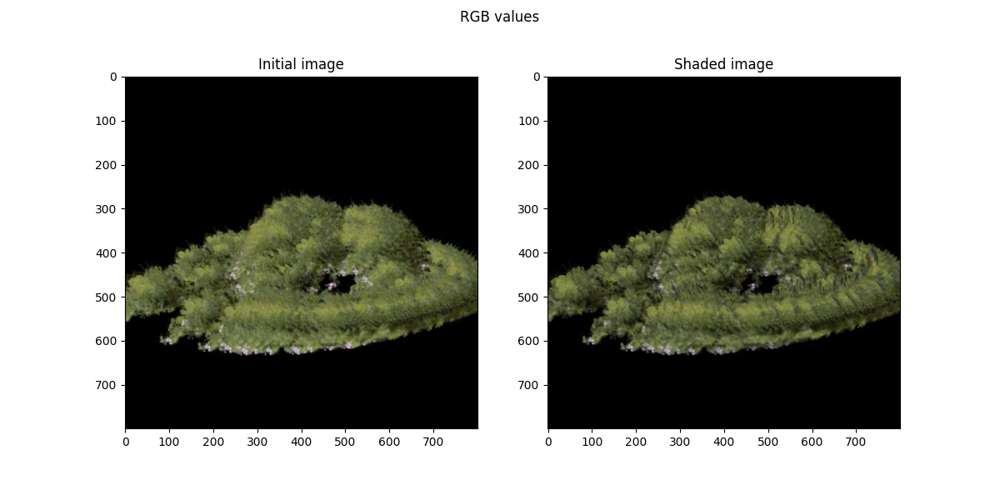

In [97]:


fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12,6))
fig.suptitle("RGB values")
image_rgb = image.detach().cpu().numpy().transpose(1, 2, 0)
image_rgb = np.clip(image_rgb*255, 0, 255).astype(np.uint8) 
ax0 = ax[0].imshow(image_rgb)
ax[0].set_title("Initial image")

image_rgb = image_shaded.detach().cpu().numpy().transpose(1, 2, 0)
image_rgb = np.clip(image_rgb*255, 0, 255).astype(np.uint8) 
ax1 = ax[1].imshow(image_rgb)
ax[1].set_title("Shaded image")

plt.show()

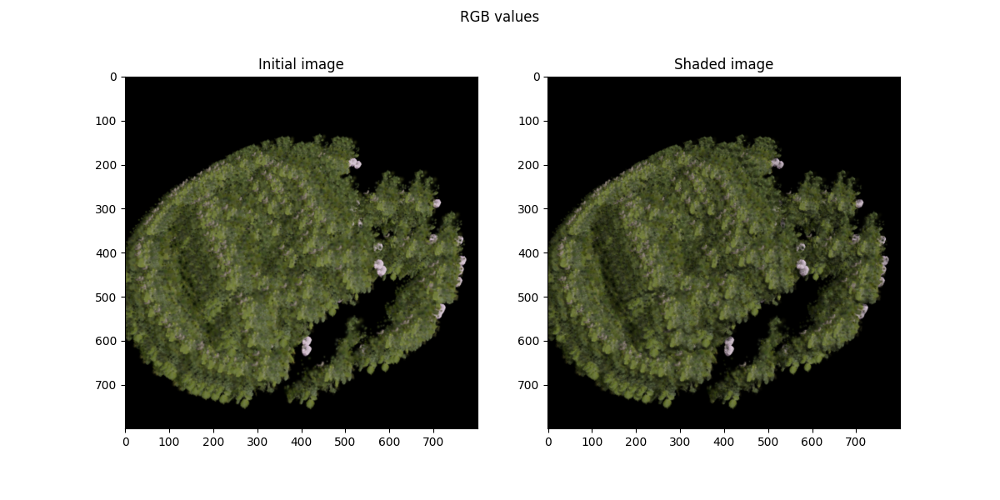

In [57]:


fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12,6))
fig.suptitle("RGB values")
image_rgb = image.detach().cpu().numpy().transpose(1, 2, 0)
image_rgb = np.clip(image_rgb*255, 0, 255).astype(np.uint8) 
ax0 = ax[0].imshow(image_rgb)
ax[0].set_title("Initial image")

image_rgb = image_shaded.detach().cpu().numpy().transpose(1, 2, 0)
image_rgb = np.clip(image_rgb*255, 0, 255).astype(np.uint8) 
ax1 = ax[1].imshow(image_rgb)
ax[1].set_title("Shaded image")

plt.show()

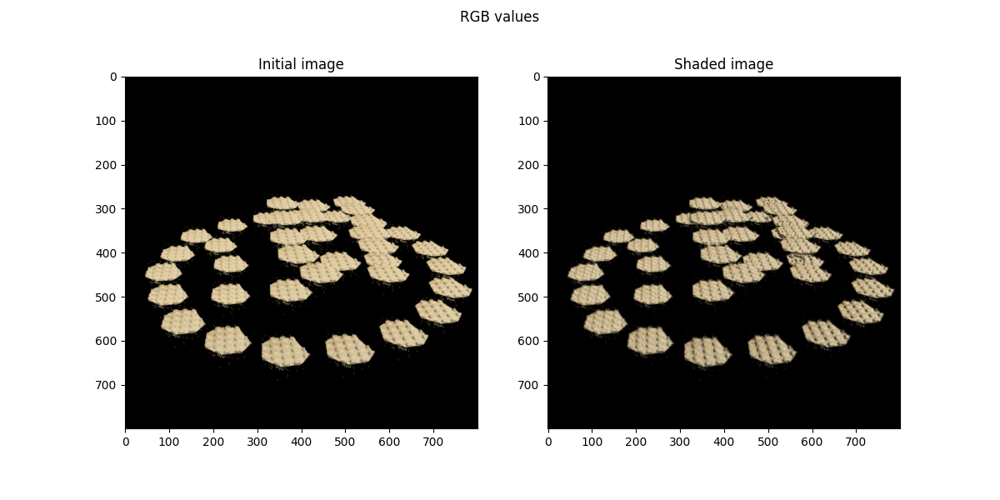

In [28]:


fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12,6))
fig.suptitle("RGB values")
image_rgb = image.detach().cpu().numpy().transpose(1, 2, 0)
image_rgb = np.clip(image_rgb*255, 0, 255).astype(np.uint8) 
ax0 = ax[0].imshow(image_rgb)
ax[0].set_title("Initial image")

image_rgb = image_shaded.detach().cpu().numpy().transpose(1, 2, 0)
image_rgb = np.clip(image_rgb*255, 0, 255).astype(np.uint8) 
ax1 = ax[1].imshow(image_rgb)
ax[1].set_title("Shaded image")

plt.show()

In [29]:
gaussians_opt._xyz.data.shape

torch.Size([117280, 3])

In [59]:
gaussians_opt.training_setup(opt)

In [60]:
import sys
sys.path.append("../")

from scene import GaussianModel
MODEL_DIR = './dummy_scene/'
MODEL_DIR_NEW = './fit_hotdog_with_lego_150clusters_percep_loss2/'
MODEL_DIR_NEW = './fit_hotdog_with_coast_rocks_40clusters/'
MODEL_DIR_NEW = './fit_hotdog_with_coast_rocks_40clusters_init_with_sh/'
MODEL_DIR_NEW = './fit_hotdog_with_lego_40clusters_init_scaled/'
MODEL_DIR_NEW = './fit_hotdog_with_rose_bush/'
os.makedirs(MODEL_DIR_NEW, exist_ok = True)

! cp -r {MODEL_DIR}* {MODEL_DIR_NEW}
# ls MODEL_DIR


iteration=1
torch.save((gaussians_opt.capture(), iteration), MODEL_DIR_NEW + "/chkpnt" + str(iteration) + ".pth")
gaussians_opt.save_ply(os.path.join(MODEL_DIR_NEW, "point_cloud/iteration_1/", "point_cloud.ply"))





In [75]:

with torch.no_grad():
    gaussians_opt._features_dc.data = gaussians_opt._xyz.data.clone().detach().unsqueeze(1)
    gaussians_opt._features_rest.data = gaussians_opt._features_rest.data * 0.

In [76]:

render_pkg = render(viewpoint_cam, gaussians_opt, pipe, background)
image, _= render_pkg["render"], render_pkg["depth"]

scaling_for_depth_blurring = 1.1
gaussians_opt._scaling.data /= scaling_for_depth_blurring
render_pkg = render(viewpoint_cam, gaussians_opt, pipe, background)
_, depth_scaled= render_pkg["render"], render_pkg["depth"]
image_shaded = shade_image_gpu(img_color=image,
                               img_depth=depth_scaled,
                          ambnt_lght=torch.tensor(np.array([.1,.1,.1])*1., dtype=torch.float32).to(device=device),
                          drct_lght_color=torch.tensor(np.array([1., 1., 1.]), dtype=torch.float32).to(device=device),
                          # drct_lght_dir =torch.tensor(np.array([-.2, -.3, 2.6]), dtype=torch.float32).to(device=device))
                          # drct_lght_dir =torch.tensor(np.array([.2, .3, 6.6]), dtype=torch.float32).to(device=device))
                               drct_lght_dir =torch.tensor(np.array([-1.0, 2.001, 3.0001]), dtype=torch.float32).to(device=device))
gaussians_opt._scaling.data *= scaling_for_depth_blurring

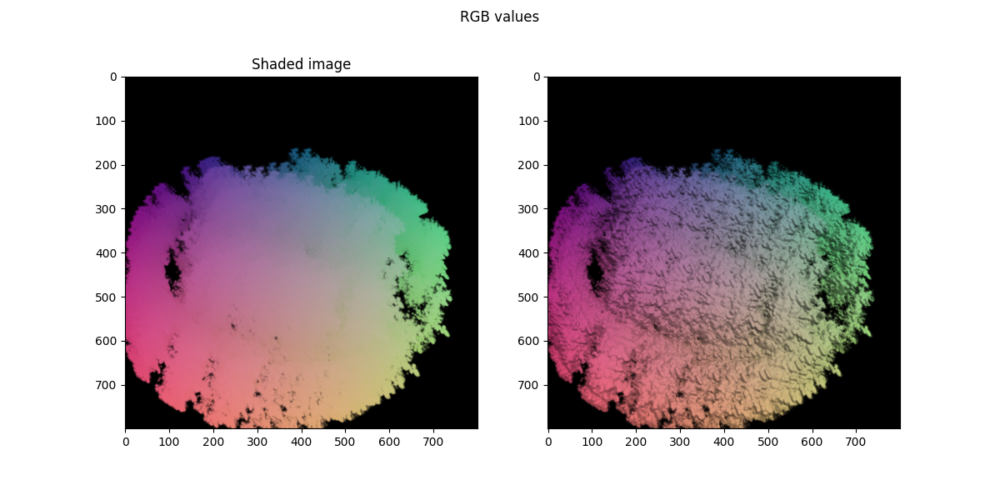

In [77]:


fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12,6))
fig.suptitle("RGB values")
image_rgb = image.detach().cpu().numpy().transpose(1, 2, 0)
image_rgb = np.clip(image_rgb*255, 0, 255).astype(np.uint8) 
ax0 = ax[0].imshow(image_rgb)
ax[0].set_title("Initial image")

image_rgb = image_shaded.detach().cpu().numpy().transpose(1, 2, 0)
image_rgb = np.clip(image_rgb*255, 0, 255).astype(np.uint8) 
ax1 = ax[1].imshow(image_rgb)
ax[0].set_title("Shaded image")

plt.show()

In [64]:

def get_descriptors(X, X_nns_indices):
    """
    Returns a matrix of distances between all points specified in the X_nns_indices matrix.
    :param X: tensor or shape [N,d]
    :param X_nns_indices: tensor of shape [N,k]
    :return 
        distances_nns : tensor of shape [N, k,k] with pairwise distances between all of the 
            k NNs for every sample in X.
    """
    
    X_nns = X[X_nns_indices]
    # All pairs can be too much
    # distances_nns = torch.norm(X_nns.unsqueeze(1) - X_nns.unsqueeze(2), dim=-1)
    # Just take all distances to the nearest neighbors
    distances_nns = torch.norm(X_nns[:,1:] - X_nns[:,0].unsqueeze(1), dim=-1)
    return distances_nns
    
def get_style_patch_descriptors_loss(clusters_to_opt_list, nns_indices, target_descriptor_cluster):
    """
    For every cluster of points in the clusters_to_opt_list we compute its descriptor of spatial 
    positions between all pairs of points within this cluster. Afterwards we compare this descriptor
    with the target descriptor.
    """
    loss_local_descriptor_list = []
    loss = 0.
    for cluster_points in clusters_to_opt_list:
        descriptor_points = get_descriptors(X=cluster_points, X_nns_indices=nns_indices)
        loss_local_descriptor = torch.mean(torch.square(descriptor_points - target_descriptor_cluster))
        loss += loss_local_descriptor 
        loss_local_descriptor_list.append(loss_local_descriptor)

    return loss / len(clusters_to_opt_list)


# now find initial desctiptors 

num_nns = 200
kth_nn = 20

num_nns = 50
kth_nn = 2
num_nns_local = 100 # was 100
kth_nn_local = 1

distances = torch.cdist(gaussians_opt._xyz.data[:N], gaussians_opt._xyz.data[:N])
_, nns_indices = torch.topk(distances, k=num_nns, largest=False, dim=-1)

nns_indices = nns_indices[:, ::kth_nn]

target_descriptor_cluster = get_descriptors(X=gaussians_opt._xyz.data[:N], 
                                            X_nns_indices=nns_indices)
target_descriptor_cluster = target_descriptor_cluster.clone().detach()
target_descriptor_cluster.shape


torch.Size([3276, 24])

In [73]:


get_style_patch_descriptors_loss(clusters_to_opt_list=[gaussians_opt._xyz[:N]],
                                 nns_indices=nns_indices,
                                 target_descriptor_cluster=target_descriptor_cluster)



tensor(0., device='cuda:0', grad_fn=<DivBackward0>)

In [79]:
def calculate_ema(values, alpha=0.01):
    ema = [values[0]]  # Initial value is the same as the first value in the list

    for i in range(1, len(values)):
        ema.append(alpha * values[i] + (1 - alpha) * ema[-1])

    return ema


def l1_loss(network_output, gt):
    return torch.abs((network_output - gt)).mean()


def tv_loss(img):
    return 0.5 * (torch.abs(img[..., 1:, :] - img[..., :-1, :]).mean() +
                  torch.abs(img[..., :, 1:] - img[..., :, :-1]).mean())



In [80]:


gaussians_opt.training_setup(opt)

In [81]:
losses_full=[]
losses_pixel = []
losses_reg = []
losses_tv = []
losses_loc_descr = []


gaussians_opt.training_setup(opt)
# for param_group in gaussians_opt.optimizer.param_groups:
#         param_group['lr'] = 1e-4


gaussians_opt._xyz.requires_grad = True
gaussians_opt._features_dc.requires_grad = True
gaussians_opt._features_rest.requires_grad = False
gaussians_opt._scaling.requires_grad = False
gaussians_opt._rotation.requires_grad = False
gaussians_opt._opacity.requires_grad = False
gaussians_opt.max_radii2D.requires_grad = False


In [82]:
# Content gaussians
content_gaussians._features_dc.data = content_gaussians_features_dc_orig.clone()
content_gaussians._features_rest.data = content_gaussians_features_rest_orig.clone()
render_pkg_cont = render(viewpoint_cam, content_gaussians, pipe, background)
image_cont, depth_cont= render_pkg_cont["render"], render_pkg_cont["depth"]
print(image_cont.shape)
print(image_cont.unsqueeze(0).shape)

image_cont_sobel_filters = kornia.filters.sobel(input=image_cont.unsqueeze(0))
content_gaussians._features_dc.data = content_gaussians._xyz.data.clone().detach().unsqueeze(1)
content_gaussians._features_rest.data = content_gaussians._features_rest.data*0.

torch.Size([3, 800, 800])
torch.Size([1, 3, 800, 800])


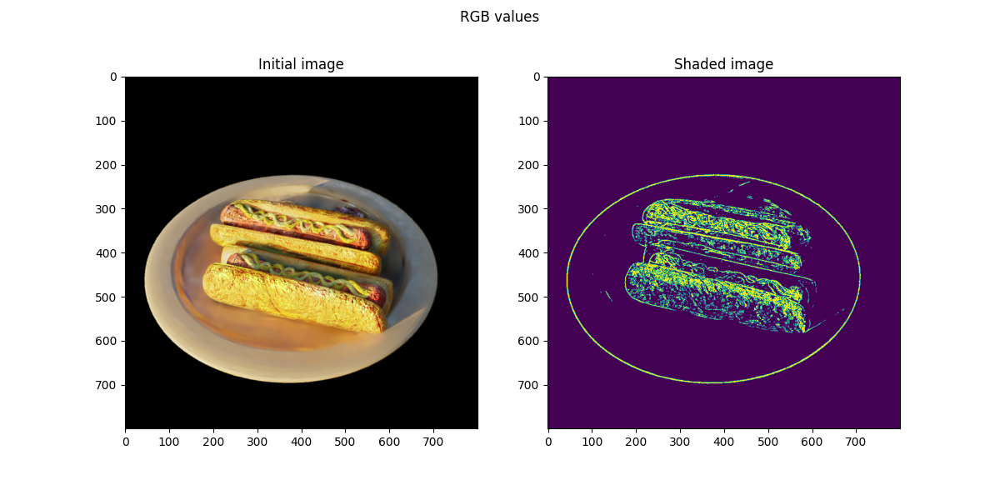

In [83]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12,6))
fig.suptitle("RGB values")
image_rgb = image_cont.detach().cpu().numpy().transpose(1, 2, 0)
image_rgb = np.clip(image_rgb*255, 0, 255).astype(np.uint8) 
ax0 = ax[0].imshow(image_rgb)
ax[0].set_title("Initial image")

image_rgb = image_cont_sobel_filters[0].detach().cpu().numpy().transpose(1, 2, 0)
image_rgb = np.clip(image_rgb*255, 0, 255).astype(np.uint8) 
ax1 = ax[1].imshow((np.sum(image_rgb, axis=-1)>40.).astype(np.float32))
ax[1].set_title("Shaded image")

plt.show()

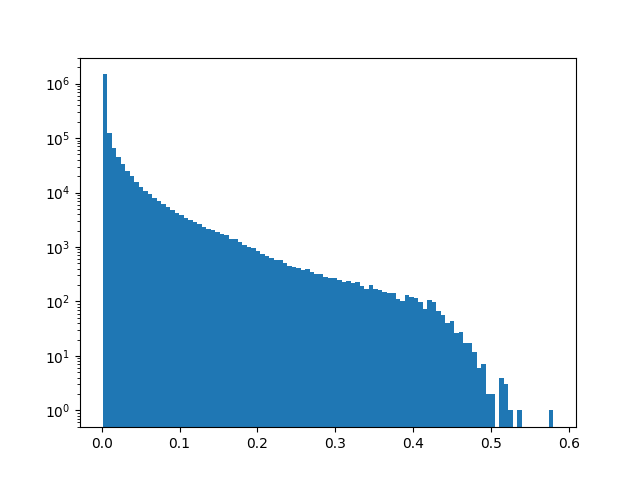

In [419]:
plt.figure()
plt.hist(image_cont_sobel_filters.detach().clone().cpu().numpy().flatten(), bins=100)
plt.yscale('log')
plt.show()

In [84]:

# Random sampling viewpoint



# def loss_to_depth_target(d, d_trg):
#     return torch.mean(torch.square(d - d_trg) * (d_trg>0.5))

def loss_to_depth_target(d, d_trg):
    return torch.mean(torch.square(d - d_trg))


from torchvision.transforms import v2
blurrer = v2.GaussianBlur(kernel_size=(31, 31), sigma=(30., 30.))


def loss_to_depth_target(d, d_trg, make_BG_large=False, blur_depth=False, blr_sgm=1.):
    d_ = d
    d_trg_ = d_trg
    if make_BG_large:
        d_trg_ = d_trg_ + (d_trg_<1e-2) * 1e2
    if blur_depth:
        d_ = gaussian_filter_2d(d_, sigma=blr_sgm)
        d_trg_ = gaussian_filter_2d(d_trg_, sigma=blr_sgm)
    return torch.mean(torch.square(d_ - d_trg_))# * (d_trg>0.01))

def renorm_cluster(cluster):
    """
    Provided a cluster of coordinates center it and normalize
    """
    return (cluster - torch.mean(cluster, dim=-1, keepdim=True)) / torch.std(cluster, dim=-1, keepdim=True)

In [85]:

for step in tqdm(range(5001)):
    gaussians_opt.optimizer.zero_grad()
    # Pick a random Camera
    
    if not viewpoint_stack:
        viewpoint_stack = scene_opt.getTrainCameras().copy()
    
    # if step < 2:
    viewpoint_cam = viewpoint_stack.pop(randint(0, len(viewpoint_stack)-1))
    # Optimization gaussians
    render_pkg = render(viewpoint_cam, gaussians_opt, pipe, background)
    image, depth= render_pkg["render"], render_pkg["depth"]
    # Content gaussians
    render_pkg_cont = render(viewpoint_cam, content_gaussians, pipe, background)
    image_cont, depth_cont= render_pkg_cont["render"], render_pkg_cont["depth"]

    # Render using original colors to get the edges.
    content_gaussians._features_dc.data = content_gaussians_features_dc_orig.clone()
    content_gaussians._features_rest.data = content_gaussians_features_rest_orig.clone()
    render_pkg_cont = render(viewpoint_cam, content_gaussians, pipe, background)
    image_cont, depth_cont= render_pkg_cont["render"], render_pkg_cont["depth"]

    # Get edges
    image_cont_sobel_filters = kornia.filters.sobel(input=image_cont.unsqueeze(0))
    content_gaussians._features_dc.data = content_gaussians._xyz.data.clone().detach().unsqueeze(1)
    content_gaussians._features_rest.data = content_gaussians._features_rest.data*0.
    


    depth_target = depth_cont.clone().detach().to(device=device)
    loss_descriptor_local = get_style_patch_descriptors_loss(
        clusters_to_opt_list=[gaussians_opt._xyz[i*N:(i+1)*N] for i in range(C)],
        nns_indices=nns_indices,
        target_descriptor_cluster=target_descriptor_cluster)

    #loss_pixel = l1_loss(image, image_cont)
    image_cont_sobel_filters_mask = (image_cont_sobel_filters > 0.2).float()
    loss_pixel = l1_loss(image, image_cont) + \
        l1_loss(image*image_cont_sobel_filters_mask, image_cont*image_cont_sobel_filters_mask) *1e1
        
    l_tv = tv_loss(image)
    l_reg = torch.mean(torch.square(gaussians_opt._xyz.unsqueeze(1) - gaussians_opt._features_dc))
    
    # loss = loss_pixel * 5e0  + l_tv * 1e-5 + l_reg * 1e1 + loss_descriptor_local * 4e6 # was 1e4
    loss = loss_pixel * 5e0  + l_tv * 0e-5 + l_reg * 1e1 + loss_descriptor_local * 4e3 # was 1e4
    # loss = loss_pixel * 5e1  + l_tv * 0e-5 + l_reg * 1e1 + loss_descriptor_local * 4e0 # was 1e4
    loss.backward()

    gaussians_opt.optimizer.step()
    losses_full.append(float(loss.detach().cpu().numpy()))
    losses_pixel.append(float(loss_pixel.detach().cpu().numpy()))
    losses_reg.append(float(l_reg.detach().cpu().numpy()))
    losses_tv.append(float(l_tv.detach().cpu().numpy()))
    losses_loc_descr.append(float(loss_descriptor_local.detach().cpu().numpy()))



    
    if step % 100 == 0:
        print(f"l_reg:{l_reg:.7f}, loss_descriptor_local:{loss_descriptor_local:.7f},",
              f"l_tv:{l_tv:.7f}, loss_pixel:{loss_pixel:.7f}, loss:{loss:.7f}")



/tmp/ipykernel_64253/2405656891.py:1: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for step in tqdm(range(5001)):


  0%|          | 0/5001 [00:00<?, ?it/s]

RuntimeError: Function UnsqueezeBackward0 returned an invalid gradient at index 0 - got [655200, 3] but expected shape compatible with [100000, 3]

In [86]:

    
if True:
    for step in tqdm(range(5001)):
        gaussians_opt.optimizer.zero_grad()
        # Pick a random Camera
        
        if not viewpoint_stack:
            viewpoint_stack = scene_opt.getTrainCameras().copy()
        
        # if step < 2:
        viewpoint_cam = viewpoint_stack.pop(randint(0, len(viewpoint_stack)-1))
        # Optimization gaussians
        render_pkg = render(viewpoint_cam, gaussians_opt, pipe, background)
        image, depth= render_pkg["render"], render_pkg["depth"]
        # Content gaussians
        render_pkg_cont = render(viewpoint_cam, content_gaussians, pipe, background)
        image_cont, depth_cont= render_pkg_cont["render"], render_pkg_cont["depth"]

        depth_target = depth_cont.clone().detach().to(device=device)
        loss_descriptor_local = get_style_patch_descriptors_loss(
            clusters_to_opt_list=[gaussians_opt._xyz[i*N:(i+1)*N] for i in range(C)],
            nns_indices=nns_indices,
            target_descriptor_cluster=target_descriptor_cluster)
 
        loss_pixel = l1_loss(image, image_cont)
        l_tv = tv_loss(image)
        l_reg = torch.mean(torch.square(gaussians_opt._xyz.unsqueeze(1) - gaussians_opt._features_dc))
        
        # loss = loss_pixel * 5e0  + l_tv * 1e-5 + l_reg * 1e1 + loss_descriptor_local * 4e6 # was 1e4
        #loss = loss_pixel * 5e0  + l_tv * 0e-5 + l_reg * 1e1 + loss_descriptor_local * 4e3 # was 1e4
        loss = loss_pixel * 5e1  + l_tv * 0e-5 + l_reg * 1e1 + loss_descriptor_local * 4e0 # was 1e4
        loss.backward()
    
        gaussians_opt.optimizer.step()
        losses_full.append(float(loss.detach().cpu().numpy()))
        losses_pixel.append(float(loss_pixel.detach().cpu().numpy()))
        losses_reg.append(float(l_reg.detach().cpu().numpy()))
        losses_tv.append(float(l_tv.detach().cpu().numpy()))
        losses_loc_descr.append(float(loss_descriptor_local.detach().cpu().numpy()))
  
    

        
        if step % 100 == 0:
            print(f"l_reg:{l_reg:.7f}, loss_descriptor_local:{loss_descriptor_local:.7f},",
                  f"l_tv:{l_tv:.7f}, loss_pixel:{loss_pixel:.7f}, loss:{loss:.7f}")

   



/tmp/ipykernel_64253/1285046106.py:2: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for step in tqdm(range(5001)):


  0%|          | 0/5001 [00:00<?, ?it/s]

RuntimeError: Function UnsqueezeBackward0 returned an invalid gradient at index 0 - got [655200, 3] but expected shape compatible with [100000, 3]

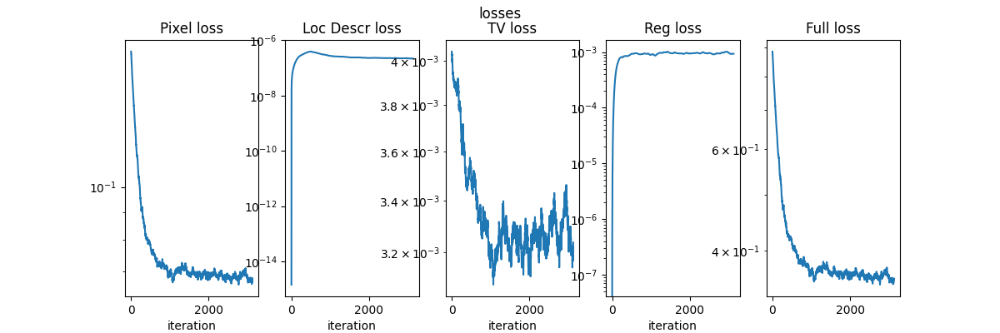

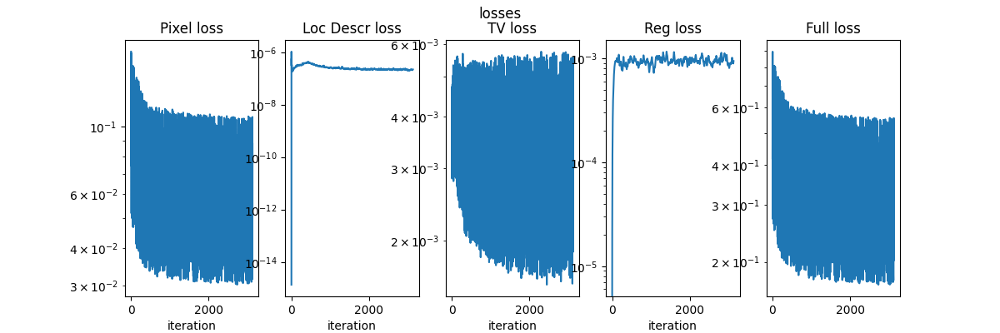

In [512]:
fig, ax = plt.subplots(nrows=1, ncols=5, figsize=(12,4))
fig.suptitle("losses")
ax[0].set_title("Pixel loss")
ax[0].plot(calculate_ema(losses_pixel))
ax[0].set_yscale('log')
ax[1].set_title("Loc Descr loss")
ax[1].plot(calculate_ema(losses_loc_descr))
ax[1].set_yscale('log')

ax[2].set_title("TV loss")
ax[2].plot(calculate_ema(losses_tv))
ax[2].set_yscale('log')
ax[3].set_title("Reg loss")
ax[3].plot(calculate_ema(losses_reg))
ax[3].set_yscale('log')
ax[4].set_title("Full loss")
ax[4].plot(calculate_ema(losses_full))
ax[4].set_yscale('log')

for i in range(4): ax[i].set_xlabel("iteration")

plt.show()

fig, ax = plt.subplots(nrows=1, ncols=5, figsize=(12,4))
fig.suptitle("losses")
ax[0].set_title("Pixel loss")
ax[0].plot(losses_pixel)
ax[0].set_yscale('log')
ax[1].set_title("Loc Descr loss")
ax[1].plot(losses_loc_descr)
ax[1].set_yscale('log')

ax[2].set_title("TV loss")
ax[2].plot(losses_tv)
ax[2].set_yscale('log')
ax[3].set_title("Reg loss")
ax[3].plot(losses_reg)
ax[3].set_yscale('log')
ax[4].set_title("Full loss")
ax[4].plot(losses_full)
ax[4].set_yscale('log')

for i in range(4): ax[i].set_xlabel("iteration")

plt.show()


In [513]:
gaussians_opt_features_dc_fitted = gaussians_opt._features_dc.data.detach().clone()

In [516]:
gaussians_opt._features_dc.data = gaussians_opt_features_dc_original.clone()
gaussians_opt._features_rest.data = gaussians_opt_features_rest_original.clone()

In [400]:
gaussians_opt._scaling.data /=  1.1

In [507]:
viewpoint_stack = scene_opt.getTrainCameras().copy()
viewpoint_cam = viewpoint_stack.pop(randint(0, len(viewpoint_stack)-1))

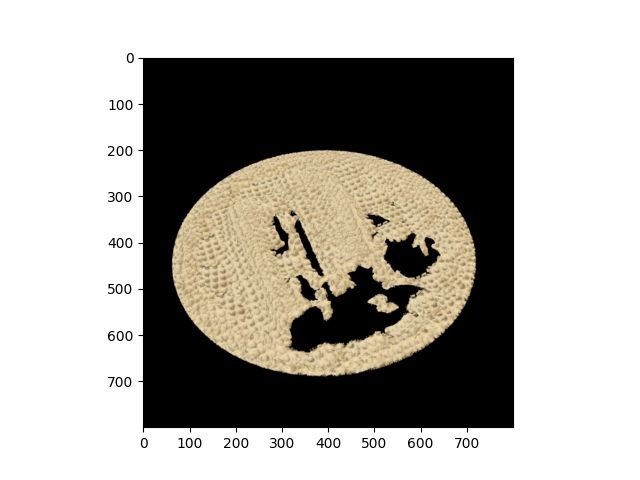

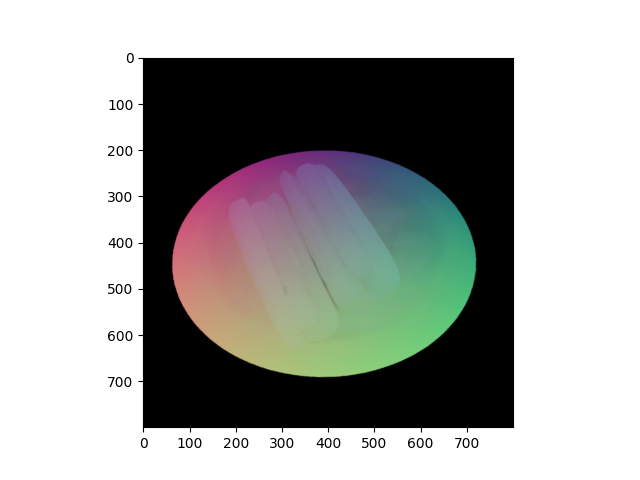

In [517]:
SCALING_FACTOR = 1.
# Sample camera

gaussians_opt._scaling.data /=  SCALING_FACTOR





# Render
render_pkg = render(viewpoint_cam, gaussians_opt, pipe, background)
image, depth= render_pkg["render"], render_pkg["depth"]
render_pkg_cont = render(viewpoint_cam, content_gaussians, pipe, background)
image_cont, depth_cont= render_pkg_cont["render"], render_pkg_cont["depth"]


# Visualize
image_rgb = image.detach().cpu().numpy().transpose(1, 2, 0)
plt.figure()
plt.imshow(image_rgb)
plt.show()
image_rgb = image_cont.detach().cpu().numpy().transpose(1, 2, 0)
plt.figure()
plt.imshow(image_rgb)
plt.show()



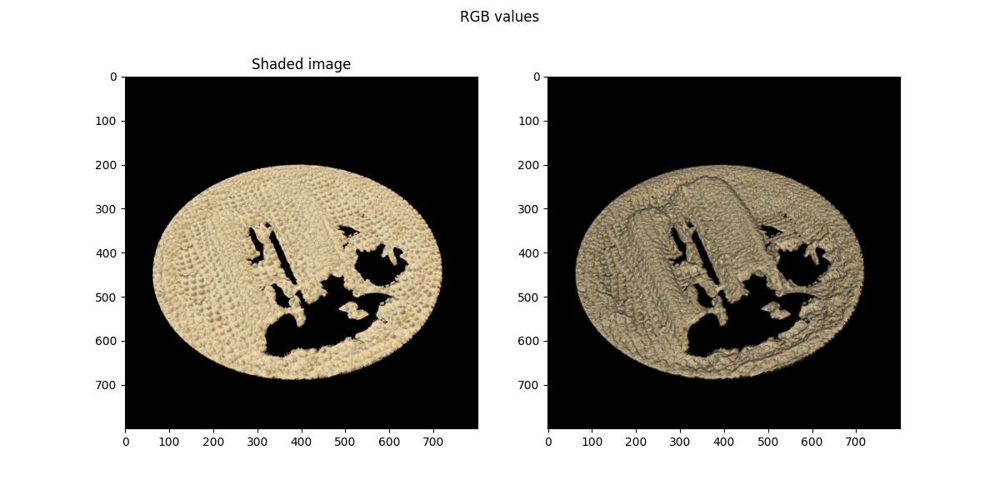

In [518]:
scaling_for_depth_blurring = 1.1

render_pkg = render(viewpoint_cam, gaussians_opt, pipe, background)
image, _= render_pkg["render"], render_pkg["depth"]


gaussians_opt._scaling.data /= scaling_for_depth_blurring
render_pkg = render(viewpoint_cam, gaussians_opt, pipe, background)
_, depth_scaled= render_pkg["render"], render_pkg["depth"]
image_shaded = shade_image_gpu(img_color=image,
                               img_depth=depth_scaled,
                          ambnt_lght=torch.tensor(np.array([.1,.1,.1])*.5, dtype=torch.float32).to(device=device),
                          drct_lght_color=torch.tensor(np.array([1., 1., 1.]), dtype=torch.float32).to(device=device),
                          drct_lght_dir =torch.tensor(np.array([-.2, -.3, 2.6]), dtype=torch.float32).to(device=device))
                          # drct_lght_dir =torch.tensor(np.array([.2, .3, 6.6]), dtype=torch.float32).to(device=device))
                               # drct_lght_dir =torch.tensor(np.array([-1.0, 2.001, 3.0001]), dtype=torch.float32).to(device=device))
gaussians_opt._scaling.data *= scaling_for_depth_blurring



gaussians_opt._scaling.data *=  SCALING_FACTOR

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12,6))
fig.suptitle("RGB values")
image_rgb = image.detach().cpu().numpy().transpose(1, 2, 0)
image_rgb = np.clip(image_rgb*255, 0, 255).astype(np.uint8) 
ax0 = ax[0].imshow(image_rgb)
ax[0].set_title("Initial image")

image_rgb = image_shaded.detach().cpu().numpy().transpose(1, 2, 0)
image_rgb = np.clip(image_rgb*255, 0, 255).astype(np.uint8) 
ax1 = ax[1].imshow(image_rgb)
ax[0].set_title("Shaded image")

plt.show()



In [297]:
K = torch.tensor([[1111, 0, 400],
                  [0, 1111, 400],
                  [0, 0,    1  ]], dtype=torch.float32).unsqueeze(0).to(device="cuda")
normals = kornia.geometry.depth.depth_to_normals(depth=depth_scaled.unsqueeze(0).unsqueeze(0),
                                                 camera_matrix=K,
                                                 normalize_points=False)


In [298]:
normals.shape

torch.Size([1, 3, 800, 800])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


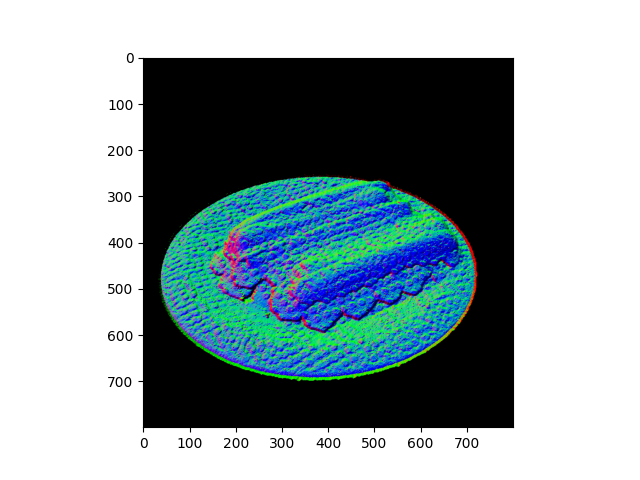

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


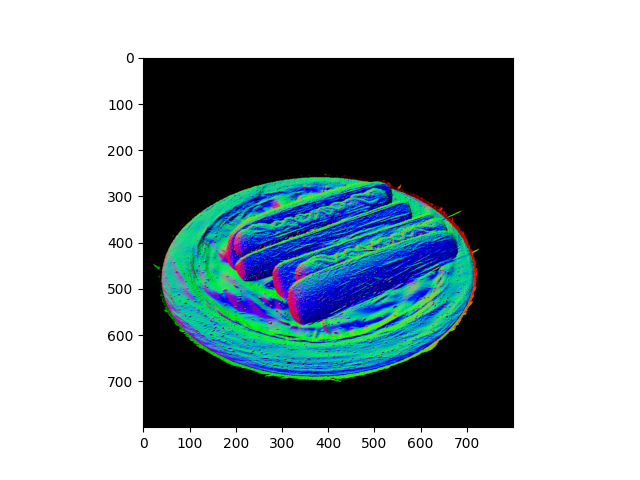

In [299]:
plt.figure()
plt.imshow(normals[0].detach().cpu().numpy().transpose(1,2,0))
plt.show()



render_pkg_cont = render(viewpoint_cam, content_gaussians, pipe, background)
image_cont, depth_cont= render_pkg_cont["render"], render_pkg_cont["depth"]

K = torch.tensor([[1111, 0, 400],
                  [0, 1111, 400],
                  [0, 0,    1  ]], dtype=torch.float32).unsqueeze(0).to(device="cuda")
normals = kornia.geometry.depth.depth_to_normals(depth=depth_cont.unsqueeze(0).unsqueeze(0),
                                                 camera_matrix=K,
                                                 normalize_points=False)

plt.figure()
plt.imshow(normals[0].detach().cpu().numpy().transpose(1,2,0))
plt.show()


In [94]:
import sys
sys.path.append("../")

from scene import GaussianModel
MODEL_DIR = './dummy_scene/'
MODEL_DIR_NEW = './fit_hotdog_with_lego_150clusters_percep_loss2/'
MODEL_DIR_NEW = './fit_hotdog_with_coast_rocks_40clusters/'
MODEL_DIR_NEW = './fit_hotdog_with_coast_rocks_40clusters_fitted_with_sh/'
os.makedirs(MODEL_DIR_NEW, exist_ok = True)

! cp -r {MODEL_DIR}* {MODEL_DIR_NEW}
# ls MODEL_DIR


iteration=1
torch.save((gaussians_opt.capture(), iteration), MODEL_DIR_NEW + "/chkpnt" + str(iteration) + ".pth")
gaussians_opt.save_ply(os.path.join(MODEL_DIR_NEW, "point_cloud/iteration_1/", "point_cloud.ply"))





In [510]:
gaussians_opt._features_dc.data = gaussians_opt_features_dc_fitted.clone()
gaussians_opt._features_rest.data *= 0.

# Now try to add perceptual loss

In [151]:

from utils.loss_utils import l1_loss, ssim, VGG, content_loss, style_loss, get_features, tv_loss
vgg = VGG().to("cuda").eval()

import torch.nn.functional as F
def get_features(input_tensor, model, preprocessing=True, size=(512,512)):
    """
    For an input tensor, it returns the features of the input tensor using a pretrained VGG model
    :param input_tensor: input tensor of shape (channels, height, width)
    :param model: pretrained VGG model
    :return: features list of features
    """
    
    x = input_tensor
    # Turn in to grayscale
    x = torch.mean(input_tensor, dim=0, keepdim=True)
    x = torch.concat([x]*3)
    
    x = x.unsqueeze(0)
    x = F.interpolate(x, size=size)#(512,512)) # was (224,224)
    x = model(x)
    return x


def content_loss(features_gt, features_pred, thresh=0.):
    """
    Compute VGG content loss on features of the input images and compare them with the ground truth image features
    :param features_gt: ground truth image features
    :param features_pred: predicted image features
    :return: content loss
    """

    # for feat in features_gt:
    #     print("feat_gt.shape:", feat.shape)
    # for feat in features_pred:
    #     print("feat_gen.shape:", feat.shape)

    # Compute the content loss
    content_loss = 0
    for i in range(len(features_gt)):
        content_loss += torch.mean(((features_gt[i] - features_pred[i])*(features_gt[i] > thresh)) ** 2)

    return content_loss


Model:
Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18)

In [152]:

target_descriptor_cluster = get_descriptors(X=gaussians_opt._xyz.data[:N], 
                                            X_nns_indices=nns_indices)
target_descriptor_cluster = target_descriptor_cluster.clone().detach()

In [153]:


get_style_patch_descriptors_loss(clusters_to_opt_list=[gaussians_opt._xyz[:N]],
                                 nns_indices=nns_indices,
                                 target_descriptor_cluster=target_descriptor_cluster)



tensor(0., device='cuda:0', grad_fn=<DivBackward0>)

In [154]:
losses_content = []
losses_tv = []
losses_full1 = []

losses_pixel = []
losses_reg = []
losses_loc_descr = []
losses_full2=[]


In [330]:
gaussians_opt.training_setup(opt)
# for param_group in gaussians_opt.optimizer.param_groups:
#         param_group['lr'] = 1e-4

gaussians_opt._xyz.requires_grad = True
gaussians_opt._features_dc.requires_grad = False #True
gaussians_opt._features_rest.requires_grad = False
gaussians_opt._scaling.requires_grad = False
gaussians_opt._rotation.requires_grad = False
gaussians_opt._opacity.requires_grad = False
gaussians_opt.max_radii2D.requires_grad = False

In [331]:
import kornia
def shade_image_gpu(img_color, img_depth,
                drct_lght_color = np.array([1., 1., 1.]), drct_lght_dir = np.array([0., 0., 1.]),
                ambnt_lght=np.array([0.1, 0.1, 0.1]) ):
    """
    Relights the image given by the color of every pixel and its normals. Additionally use the sf
    Implementation is taken from this video https://youtu.be/wOyavGx28uU?t=1084 .
    :param img_color: numpy array of shape [H,W,D] with values in [0,1]
    :param img_normals: numpy array of shape [H,W,D] with values in [0,1] and norm along last dim is 1
    :param 
    
    """

     
    K = torch.tensor([[1111, 0, 400],
                  [0, 1111, 400],
                  [0, 0,    1  ]], dtype=torch.float32).unsqueeze(0).to(device="cuda")
    normals = kornia.geometry.depth.depth_to_normals(depth=img_depth.unsqueeze(0).unsqueeze(0),
                                                     camera_matrix=K,
                                                     normalize_points=True)
    #normals

    #print(normals)
    #print(normals[0].shape)
    image_normals = normals.squeeze(0).squeeze(0)
    #print(image_normals.shape)
    mins = torch.min(image_normals)
    maxs = torch.max(image_normals)
    image_normals = (image_normals - mins) / (maxs - mins + 1e-6)
    
    drct_lght_color = drct_lght_color.unsqueeze(-1).unsqueeze(-1)
    ambnt_lght = ambnt_lght.unsqueeze(-1).unsqueeze(-1)
    drct_lght_dir = drct_lght_dir / (1e-6 + torch.linalg.norm(drct_lght_dir))
    #print("drct_lght_color.shape:", drct_lght_color.shape)
    #print("image_normals.shape:", image_normals.shape)
    #print("drct_lght_dir.shape:", drct_lght_dir.shape)
    #print("ambnt_lght.shape:", ambnt_lght.shape)
    #print(torch.einsum('ihw,i->hw', image_normals, drct_lght_dir))
    reflected_light = drct_lght_color * (torch.einsum('ihw,i->hw', image_normals, drct_lght_dir).unsqueeze(0))
    #print("reflected_light.shape:", reflected_light.shape)
    color =  img_color * (reflected_light*(1.-torch.max(ambnt_lght))+ambnt_lght)
    return color 


In [332]:
# Presave original values of colors for content and optimization scene.
content_gaussians_features_ds_original = content_gaussians._features_dc.detach().clone()
gaussians_opt_features_ds_original = gaussians_opt._features_dc.detach().clone()
gaussians_opt_opacity_original = gaussians_opt._opacity.detach().clone()


In [333]:
for step in tqdm(range(5001)):
    # Sample camera
    if not viewpoint_stack:
        viewpoint_stack = scene_opt.getTrainCameras().copy()
    viewpoint_cam = viewpoint_stack.pop(randint(0, len(viewpoint_stack)-1))

    gaussians_opt.optimizer.zero_grad()


    # STEP 1    
    # Compute initial renderings of content and optimization scene.
    scaling_for_depth_blurring = 1.1
    gaussians_opt._scaling.data /= scaling_for_depth_blurring
    render_pkg = render(viewpoint_cam, gaussians_opt, pipe, background)
    image, depth_scaled = render_pkg["render"], render_pkg["depth"]
    # Content gaussians
    render_pkg_cont = render(viewpoint_cam, content_gaussians, pipe, background)
    image_cont, depth_cont= render_pkg_cont["render"], render_pkg_cont["depth"]
    # Add shading to the optimization scene
    image_shaded = shade_image_gpu(
        img_color=image,
        img_depth=depth_scaled,
        ambnt_lght=torch.tensor(np.array([.1,.1,.1])*.5, dtype=torch.float32).to(device=device),
        drct_lght_color=torch.tensor(np.array([1., 1., 1.]), dtype=torch.float32).to(device=device),
        drct_lght_dir =torch.tensor(np.array([-.2, -.3, 2.6]), dtype=torch.float32).to(device=device))
    gaussians_opt._scaling.data *= scaling_for_depth_blurring
    # Get features
    img_opt_feats = get_features(input_tensor=image_shaded, model=vgg, size=(224, 224))
    img_cont_feats = get_features(input_tensor=image_cont, model=vgg, size=(224, 224))
    # Compute losses and optimize
    layers_style = [0]
    layers_content = [3] #[2, 3]#, [2,3]
    l_cont = content_loss([img_opt_feats[i] for i in layers_content], [img_cont_feats[i]  for i in layers_content], thresh=0.)
    l_tv = tv_loss(image)
    # loss_descriptor_local = get_style_patch_descriptors_loss(
    #     clusters_to_opt_list=[gaussians_opt._xyz[i*N:(i+1)*N] for i in range(C)],
    #     nns_indices=nns_indices,
    #     target_descriptor_cluster=target_descriptor_cluster)

    # loss = l_cont * 1e1 + l_tv * 0. + loss_descriptor_local * 4e7 #1e-7 # tv_loss weight was 1e-3

    # Backprop values and save losses
    # loss.backward()
    # losses_content.append(l_cont.data.cpu().numpy())
    # losses_tv.append(l_tv.data.cpu().numpy())
    # losses_full.append(loss.data.cpu().numpy())
    # gaussians_opt.optimizer.step()


    # STEP 2
    # Replace color with coords
    
    
    gaussians_opt._features_dc.data = gaussians_opt._xyz.data.clone().detach().unsqueeze(1)
    content_gaussians._features_dc.data = content_gaussians._xyz.data.clone().detach().unsqueeze(1)
    # Compute losses
    #gaussians_opt.optimizer.zero_grad()

    # Optimization gaussians
    render_pkg = render(viewpoint_cam, gaussians_opt, pipe, background)
    image, depth= render_pkg["render"], render_pkg["depth"]
    # Content gaussians
    render_pkg_cont = render(viewpoint_cam, content_gaussians, pipe, background)
    image_cont, depth_cont= render_pkg_cont["render"], render_pkg_cont["depth"]

    depth_target = depth_cont.clone().detach().to(device=device)
    loss_descriptor_local = get_style_patch_descriptors_loss(
        clusters_to_opt_list=[gaussians_opt._xyz[i*N:(i+1)*N] for i in range(C)],
        nns_indices=nns_indices,
        target_descriptor_cluster=target_descriptor_cluster)

    loss_pixel = l1_loss(image, image_cont)
    l_tv = tv_loss(image)
    l_reg = torch.mean(torch.square(gaussians_opt._xyz.unsqueeze(1) - gaussians_opt._features_dc))
    
    # loss = loss_pixel * 5e0  + l_tv * 1e-5 + l_reg * 1e1 + loss_descriptor_local * 4e6 # was 1e4
    #loss = loss_pixel * 5e0  + l_tv * 0e-5 + l_reg * 1e1 + loss_descriptor_local * 4e4 # was 1e4
    loss = loss_pixel * 5e0  + l_tv * 0e-5 + l_reg * 1e1 + loss_descriptor_local * 4e6 + l_cont * 3e-2
    
    loss.backward()
    gaussians_opt.optimizer.step()
    
    losses_full2.append(float(loss.detach().cpu().numpy()))
    losses_pixel.append(float(loss_pixel.detach().cpu().numpy()))
    losses_reg.append(float(l_reg.detach().cpu().numpy()))
    losses_tv.append(float(l_tv.detach().cpu().numpy()))
    losses_loc_descr.append(float(loss_descriptor_local.detach().cpu().numpy()))
    losses_content.append(l_cont.data.cpu().numpy())

    # Backrprop


    
    # Restore values of colors for both scenes
    content_gaussians._features_dc.data = content_gaussians_features_ds_original
    gaussians_opt._features_dc.data = gaussians_opt_features_ds_original


    # Print loss values
    if step % 100 == 0:
        print(f"l_reg:{l_reg:.7f}, loss_dscr_lcl:{loss_descriptor_local:.7f}, l_cont:{l_cont:.7f}",
              f"l_tv:{l_tv:.7f}, loss_pxl:{loss_pixel:.7f}, loss:{loss:.7f}")

/tmp/ipykernel_266174/936817272.py:1: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for step in tqdm(range(5001)):


  0%|          | 0/5001 [00:00<?, ?it/s]

l_reg:0.0000000, loss_dscr_lcl:0.0000002, l_cont:0.9380491 l_tv:0.0016856, loss_pxl:0.0054621, loss:0.8262282
l_reg:0.0000000, loss_dscr_lcl:0.0000000, l_cont:0.9491188 l_tv:0.0016646, loss_pxl:0.0053177, loss:0.1063541
l_reg:0.0000000, loss_dscr_lcl:0.0000000, l_cont:0.8454211 l_tv:0.0013511, loss_pxl:0.0043001, loss:0.0983208
l_reg:0.0000000, loss_dscr_lcl:0.0000000, l_cont:0.8137698 l_tv:0.0013968, loss_pxl:0.0041277, loss:0.0955619
l_reg:0.0000000, loss_dscr_lcl:0.0000000, l_cont:0.5811796 l_tv:0.0011596, loss_pxl:0.0040187, loss:0.0881047
l_reg:0.0000000, loss_dscr_lcl:0.0000000, l_cont:0.8690942 l_tv:0.0022809, loss_pxl:0.0048851, loss:0.1004878
l_reg:0.0000000, loss_dscr_lcl:0.0000000, l_cont:0.8228780 l_tv:0.0022621, loss_pxl:0.0047986, loss:0.0976887
l_reg:0.0000000, loss_dscr_lcl:0.0000000, l_cont:0.6206061 l_tv:0.0011904, loss_pxl:0.0034665, loss:0.0857229
l_reg:0.0000000, loss_dscr_lcl:0.0000000, l_cont:0.7558841 l_tv:0.0013969, loss_pxl:0.0035703, loss:0.0898355
l_reg:0.00

KeyboardInterrupt: 

In [352]:
gaussians_opt.training_setup(opt)
# for param_group in gaussians_opt.optimizer.param_groups:
#         param_group['lr'] = 1e-4

gaussians_opt._xyz.requires_grad = False
gaussians_opt._features_dc.requires_grad = True #True
gaussians_opt._features_rest.requires_grad = False
gaussians_opt._scaling.requires_grad = False
gaussians_opt._rotation.requires_grad = False
gaussians_opt._opacity.requires_grad = True
gaussians_opt.max_radii2D.requires_grad = False

In [353]:
for step in tqdm(range(5001)):
    # Sample camera
    if not viewpoint_stack:
        viewpoint_stack = scene_opt.getTrainCameras().copy()
    viewpoint_cam = viewpoint_stack.pop(randint(0, len(viewpoint_stack)-1))

    gaussians_opt.optimizer.zero_grad()


    # STEP 1    
    # Compute initial renderings of content and optimization scene.
    scaling_for_depth_blurring = 1.1
    gaussians_opt._scaling.data /= scaling_for_depth_blurring
    render_pkg = render(viewpoint_cam, gaussians_opt, pipe, background)
    image, depth_scaled = render_pkg["render"], render_pkg["depth"]
    # Content gaussians
    render_pkg_cont = render(viewpoint_cam, content_gaussians, pipe, background)
    image_cont, depth_cont= render_pkg_cont["render"], render_pkg_cont["depth"]
    # Add shading to the optimization scene
    image_shaded = shade_image_gpu(
        img_color=image,
        img_depth=depth_scaled,
        ambnt_lght=torch.tensor(np.array([.1,.1,.1])*.5, dtype=torch.float32).to(device=device),
        drct_lght_color=torch.tensor(np.array([1., 1., 1.]), dtype=torch.float32).to(device=device),
        drct_lght_dir =torch.tensor(np.array([-.2, -.3, 2.6]), dtype=torch.float32).to(device=device))
    gaussians_opt._scaling.data *= scaling_for_depth_blurring
    # Get features
    img_opt_feats = get_features(input_tensor=image_shaded, model=vgg, size=(224, 224))
    img_cont_feats = get_features(input_tensor=image_cont, model=vgg, size=(224, 224))
    # Compute losses and optimize
    layers_style = [0]
    layers_content = [3] #[2, 3]#, [2,3]
    l_cont = content_loss([img_opt_feats[i] for i in layers_content], [img_cont_feats[i]  for i in layers_content], thresh=0.)
    
    loss =  l_cont * 3e-2
    
    loss.backward()
    gaussians_opt.optimizer.step()
    
    losses_content.append(l_cont.data.cpu().numpy())

    # Backrprop




    # Print loss values
    if step % 100 == 0:
        print(f"l_reg:{l_reg:.7f}, loss_dscr_lcl:{loss_descriptor_local:.7f}, l_cont:{l_cont:.7f}",
              f"l_tv:{l_tv:.7f}, loss_pxl:{loss_pixel:.7f}, loss:{loss:.7f}")

/tmp/ipykernel_266174/676642937.py:1: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for step in tqdm(range(5001)):


  0%|          | 0/5001 [00:00<?, ?it/s]

l_reg:0.0000000, loss_dscr_lcl:0.0000000, l_cont:3.2456553 l_tv:0.0014331, loss_pxl:0.0028774, loss:0.0973697
l_reg:0.0000000, loss_dscr_lcl:0.0000000, l_cont:1.6159042 l_tv:0.0014331, loss_pxl:0.0028774, loss:0.0484771
l_reg:0.0000000, loss_dscr_lcl:0.0000000, l_cont:2.2674992 l_tv:0.0014331, loss_pxl:0.0028774, loss:0.0680250
l_reg:0.0000000, loss_dscr_lcl:0.0000000, l_cont:2.5092878 l_tv:0.0014331, loss_pxl:0.0028774, loss:0.0752786
l_reg:0.0000000, loss_dscr_lcl:0.0000000, l_cont:2.7789898 l_tv:0.0014331, loss_pxl:0.0028774, loss:0.0833697
l_reg:0.0000000, loss_dscr_lcl:0.0000000, l_cont:2.0439966 l_tv:0.0014331, loss_pxl:0.0028774, loss:0.0613199
l_reg:0.0000000, loss_dscr_lcl:0.0000000, l_cont:1.9260808 l_tv:0.0014331, loss_pxl:0.0028774, loss:0.0577824
l_reg:0.0000000, loss_dscr_lcl:0.0000000, l_cont:1.3136379 l_tv:0.0014331, loss_pxl:0.0028774, loss:0.0394091
l_reg:0.0000000, loss_dscr_lcl:0.0000000, l_cont:1.0232679 l_tv:0.0014331, loss_pxl:0.0028774, loss:0.0306980
l_reg:0.00

KeyboardInterrupt: 

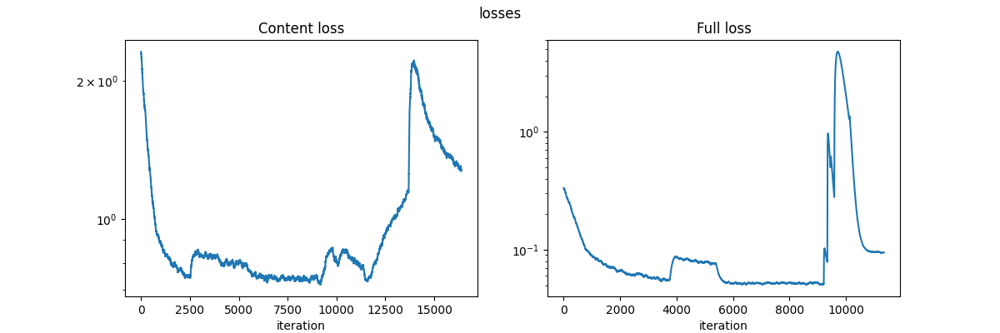

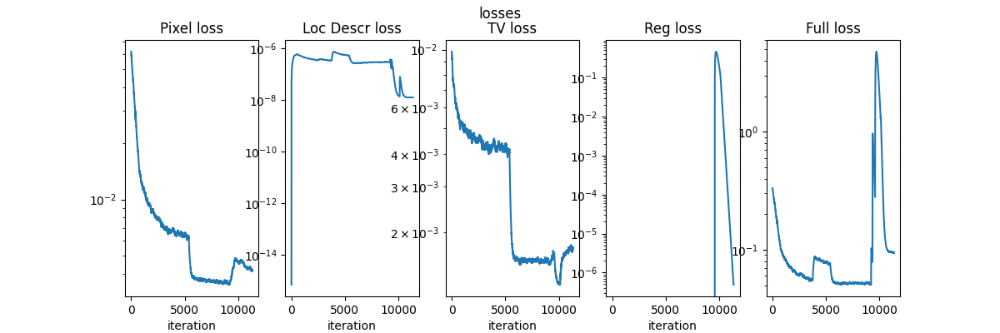

In [354]:


fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12,4))
fig.suptitle("losses")
ax[0].set_title("Content loss")
ax[0].plot(calculate_ema(losses_content))
ax[0].set_yscale('log')

ax[1].set_title("Full loss")
ax[1].plot(calculate_ema(losses_full2))
ax[1].set_yscale('log')

for i in range(2): ax[i].set_xlabel("iteration")
plt.show()


fig, ax = plt.subplots(nrows=1, ncols=5, figsize=(12,4))
fig.suptitle("losses")
ax[0].set_title("Pixel loss")
ax[0].plot(calculate_ema(losses_pixel))
ax[0].set_yscale('log')
ax[1].set_title("Loc Descr loss")
ax[1].plot(calculate_ema(losses_loc_descr))
ax[1].set_yscale('log')

ax[2].set_title("TV loss")
ax[2].plot(calculate_ema(losses_tv))
ax[2].set_yscale('log')
ax[3].set_title("Reg loss")
ax[3].plot(calculate_ema(losses_reg))
ax[3].set_yscale('log')
ax[4].set_title("Full loss")
ax[4].plot(calculate_ema(losses_full2))
ax[4].set_yscale('log')

for i in range(4): ax[i].set_xlabel("iteration")

plt.show()


In [336]:

content_gaussians._features_dc.data = content_gaussians_features_ds_original
gaussians_opt._features_dc.data = gaussians_opt_features_ds_original

In [137]:
gaussians_opt_features_dc_fitted = gaussians_opt._features_dc.data.detach().clone()

In [ ]:
gaussians_opt._features_dc.data = gaussians_opt_features_dc_original.clone()

In [359]:
gaussians_opt._scaling.data *=  1.1

In [258]:
gaussians_opt._scaling.data /=  1.1

In [ ]:
d

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


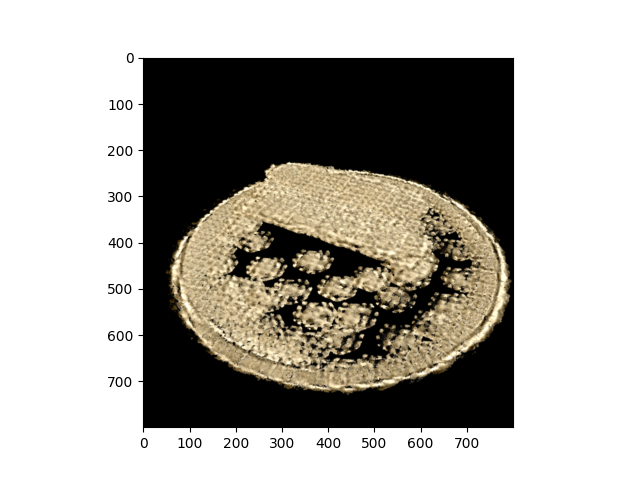

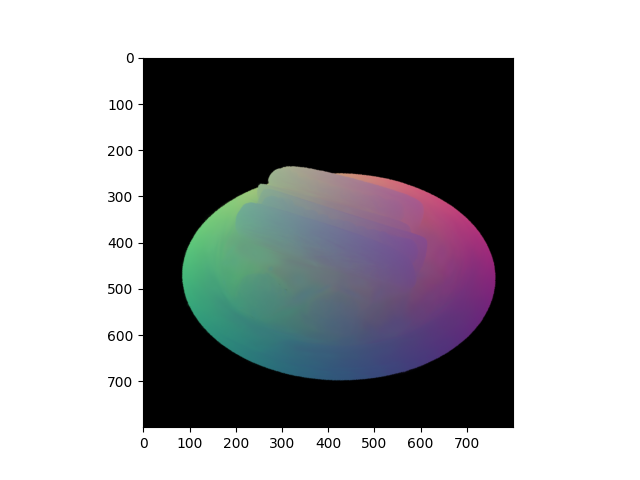

In [361]:

# Sample camera
viewpoint_stack = scene_opt.getTrainCameras().copy()
viewpoint_cam = viewpoint_stack.pop(randint(0, len(viewpoint_stack)-1))
gaussians_opt._scaling.data /=  1.1





# Render
render_pkg = render(viewpoint_cam, gaussians_opt, pipe, background)
image, depth= render_pkg["render"], render_pkg["depth"]
render_pkg_cont = render(viewpoint_cam, content_gaussians, pipe, background)
image_cont, depth_cont= render_pkg_cont["render"], render_pkg_cont["depth"]


# Visualize
image_rgb = image.detach().cpu().numpy().transpose(1, 2, 0)
plt.figure()
plt.imshow(image_rgb)
plt.show()
image_rgb = image_cont.detach().cpu().numpy().transpose(1, 2, 0)
plt.figure()
plt.imshow(image_rgb)
plt.show()



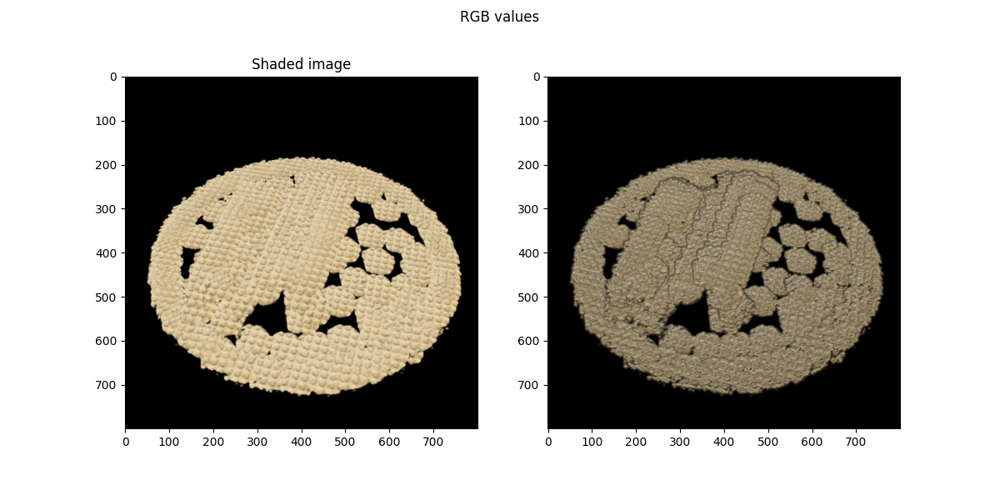

In [351]:
scaling_for_depth_blurring = 1.0
gaussians_opt._scaling.data /= scaling_for_depth_blurring
render_pkg = render(viewpoint_cam, gaussians_opt, pipe, background)
image, _= render_pkg["render"], render_pkg["depth"]


render_pkg = render(viewpoint_cam, gaussians_opt, pipe, background)
_, depth_scaled= render_pkg["render"], render_pkg["depth"]
image_shaded = shade_image_gpu(img_color=image,
                               img_depth=depth_scaled,
                          ambnt_lght=torch.tensor(np.array([.1,.1,.1])*.5, dtype=torch.float32).to(device=device),
                          drct_lght_color=torch.tensor(np.array([1., 1., 1.]), dtype=torch.float32).to(device=device),
                          drct_lght_dir =torch.tensor(np.array([-.2, -.3, 2.6]), dtype=torch.float32).to(device=device))
                          # drct_lght_dir =torch.tensor(np.array([.2, .3, 6.6]), dtype=torch.float32).to(device=device))
                               # drct_lght_dir =torch.tensor(np.array([-1.0, 2.001, 3.0001]), dtype=torch.float32).to(device=device))
gaussians_opt._scaling.data *= scaling_for_depth_blurring



gaussians_opt._scaling.data *=  1.1

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12,6))
fig.suptitle("RGB values")
image_rgb = image.detach().cpu().numpy().transpose(1, 2, 0)
image_rgb = np.clip(image_rgb*255, 0, 255).astype(np.uint8) 
ax0 = ax[0].imshow(image_rgb)
ax[0].set_title("Initial image")

image_rgb = image_shaded.detach().cpu().numpy().transpose(1, 2, 0)
image_rgb = np.clip(image_rgb*255, 0, 255).astype(np.uint8) 
ax1 = ax[1].imshow(image_rgb)
ax[0].set_title("Shaded image")

plt.show()



In [272]:
N

2714

In [299]:
colors = torch.nn.Parameter(torch.randn((C,3), dtype=torch.float32))
colors_gaussians = torch.concat([torch.stack([x]*N, dim=0) for x in colors], dim=0).unsqueeze(1).to(device=device)

In [289]:
torch.concat([torch.stack([x]*N, dim=0) for x in colors], dim=0).shape

torch.Size([407100, 3])

In [292]:
gaussians_opt._features_dc.shape, colors_gaussians.shape

(torch.Size([407100, 1, 3]), torch.Size([407100, 1, 3]))

In [294]:
torch.mean(gaussians_opt._features_dc, dim=(0,1)), torch.std(gaussians_opt._features_dc, dim=(0,1))

(tensor([1.2011, 0.9161, 0.3345], device='cuda:0', grad_fn=<MeanBackward1>),
 tensor([0.3364, 0.3345, 0.3160], device='cuda:0', grad_fn=<StdBackward0>))

In [295]:
torch.mean(colors_gaussians, dim=(0,1)), torch.std(colors_gaussians, dim=(0,1))

(tensor([ 0.1565,  0.0693, -0.1191], grad_fn=<MeanBackward1>),
 tensor([1.0236, 1.0398, 1.1072], grad_fn=<StdBackward0>))

In [300]:
gaussians_opt._features_dc.data = gaussians_opt._features_dc.data + colors_gaussians.data

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


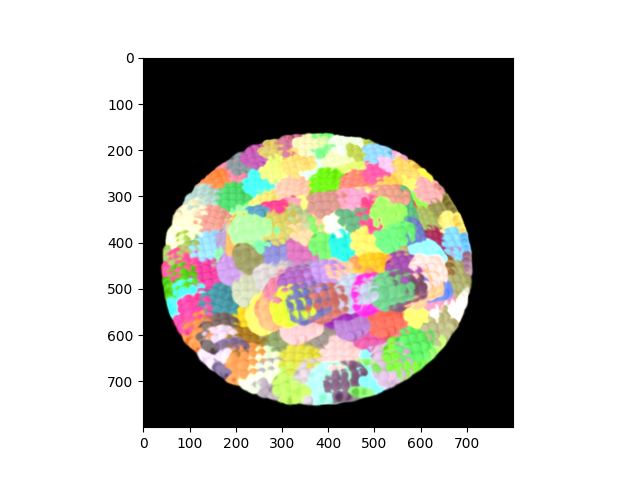

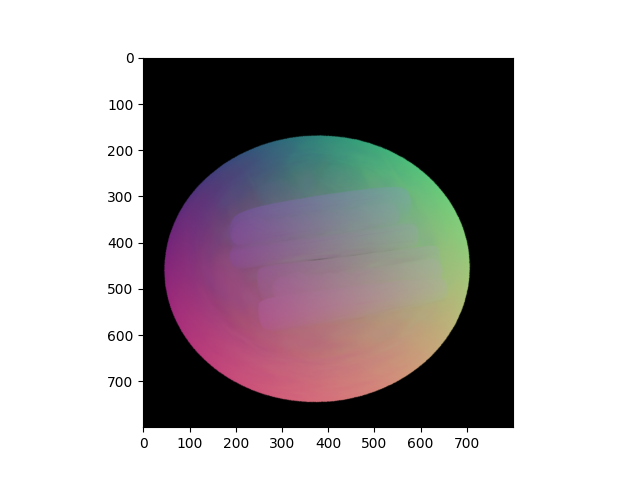

In [303]:

# Sample camera
viewpoint_stack = scene_opt.getTrainCameras().copy()
viewpoint_cam = viewpoint_stack.pop(randint(0, len(viewpoint_stack)-1))
gaussians_opt._scaling.data /=  1.1





# Render
render_pkg = render(viewpoint_cam, gaussians_opt, pipe, background)
image, depth= render_pkg["render"], render_pkg["depth"]
render_pkg_cont = render(viewpoint_cam, content_gaussians, pipe, background)
image_cont, depth_cont= render_pkg_cont["render"], render_pkg_cont["depth"]


# Visualize
image_rgb = image.detach().cpu().numpy().transpose(1, 2, 0)
plt.figure()
plt.imshow(image_rgb)
plt.show()
image_rgb = image_cont.detach().cpu().numpy().transpose(1, 2, 0)
plt.figure()
plt.imshow(image_rgb)
plt.show()



In [127]:
import sys
sys.path.append("../")

from scene import GaussianModel
MODEL_DIR = './dummy_scene/'
MODEL_DIR_NEW = './fit_hotdog_with_lego_150clusters_percep_loss2/'
MODEL_DIR_NEW = './fit_hotdog_with_coast_rocks_40clusters/'
os.makedirs(MODEL_DIR_NEW, exist_ok = True)

! cp -r {MODEL_DIR}* {MODEL_DIR_NEW}
# ls MODEL_DIR


iteration=1
torch.save((gaussians_opt.capture(), iteration), MODEL_DIR_NEW + "/chkpnt" + str(iteration) + ".pth")
gaussians_opt.save_ply(os.path.join(MODEL_DIR_NEW, "point_cloud/iteration_1/", "point_cloud.ply"))





In [795]:
N,C

(2714, 150)

In [810]:
gaussians_opt._scaling.data *=  1.1 

In [804]:
SCALING  = 1.0
content_gaussians._scaling.data /=  SCALING
gaussians_opt._scaling.data /=  SCALING
render_pkg = render(viewpoint_cam, gaussians_opt, pipe, background)
image, depth= render_pkg["render"], render_pkg["depth"]
gaussians_opt._scaling.data *=  SCALING
content_gaussians._scaling.data *=  SCALING
K = torch.tensor([[1111, 0, 400],
                  [0, 1111, 400],
                  [0, 0,    1  ]], dtype=torch.float32).unsqueeze(0).to(device="cuda")
normals = kornia.geometry.depth.depth_to_normals(depth=depth.unsqueeze(0).unsqueeze(0),
                                                 camera_matrix=K,
                                                 normalize_points=False)
#normals

#print(normals)
#print(normals[0].shape)
image_normals = normals.squeeze(0).squeeze(0)
#print(image_normals.shape)
mins = torch.min(image_normals)
maxs = torch.max(image_normals)
image_normals = (image_normals - mins) / (maxs - mins + 1e-6)

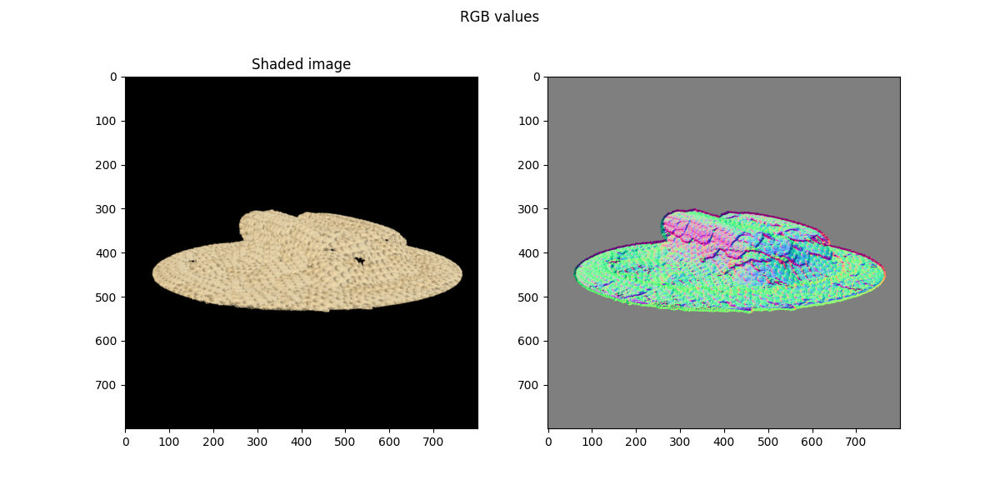

In [805]:

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12,6))
fig.suptitle("RGB values")
image_rgb = image.detach().cpu().numpy().transpose(1, 2, 0)
image_rgb = np.clip(image_rgb*255, 0, 255).astype(np.uint8) 
ax0 = ax[0].imshow(image_rgb)
ax[0].set_title("Initial image")

image_rgb = image_normals.detach().cpu().numpy().transpose(1, 2, 0)
image_rgb = np.clip(image_rgb*255, 0, 255).astype(np.uint8) 
ax1 = ax[1].imshow(image_rgb)
ax[0].set_title("Shaded image")

plt.show()

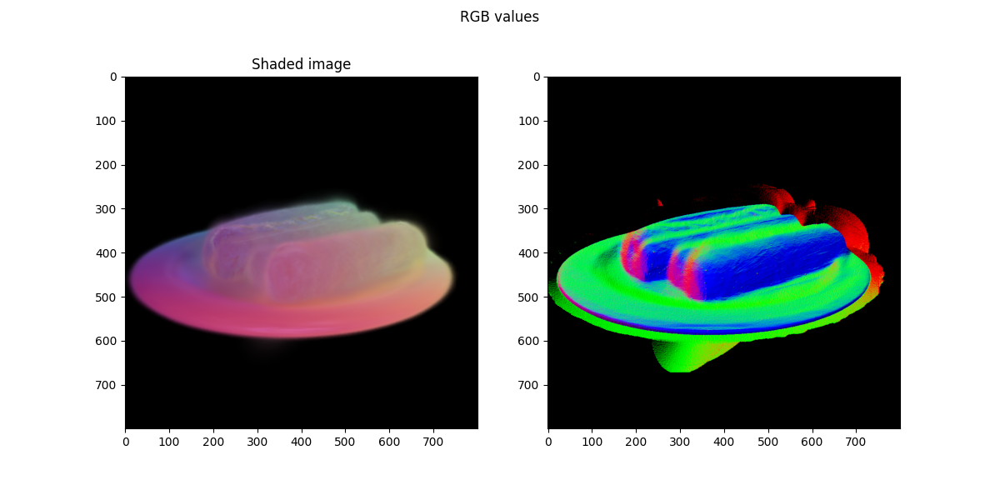

In [557]:

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12,6))
fig.suptitle("RGB values")
image_rgb = image.detach().cpu().numpy().transpose(1, 2, 0)
image_rgb = np.clip(image_rgb*255, 0, 255).astype(np.uint8) 
ax0 = ax[0].imshow(image_rgb)
ax[0].set_title("Initial image")

image_rgb = image_normals.detach().cpu().numpy().transpose(1, 2, 0)
image_rgb = np.clip(image_rgb*255, 0, 255).astype(np.uint8) 
ax1 = ax[1].imshow(image_rgb)
ax[0].set_title("Shaded image")

plt.show()